```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 前處理

In [2]:
# df = load_original_data('./pocket/202301101952/source')

In [3]:
# df['acc_x'] = moving_average(df['acc_x'], 11)
# df['acc_y'] = moving_average(df['acc_y'], 11)
# df['acc_z'] = moving_average(df['acc_z'], 11)

# df['acc_t'] = np.sqrt((df['acc_x'] ** 2) + (df['acc_y'] ** 2) + (df['acc_z'] ** 2))
# # df['acc_t'] = moving_average(df['acc_t'], 41)
# df['acc_v'] = 9.8
# df['acc_h'] = np.abs(df['acc_t'] - df['acc_v'])
# # df['angle'] = 90 - np.arctan(df['acc_v'] / df['acc_h']) / np.pi * 180
# a = df['acc_v'] / df['acc_t']
# a[a >= 1] = 1
# df['angle'] = np.arcsin(a) / np.pi * 180
# # df['angle'] = np.arccos(df['acc_h'] / df['acc_t']) / np.pi * 180

# df['mag_h'] = df['mag_t'] * np.cos(df['angle'] / 180 * np.pi)
# df['mag_v'] = df['mag_t'] * np.sin(df['angle'] / 180 * np.pi)

In [4]:
# df['est_agnle'] = np.arcsin(np.abs(df['mag_z'] / df['mag_t'])) / np.pi * 180

In [5]:
# plt.figure()
# # plt.plot(np.arange(len(df)), df['angle'])
# plt.plot(np.arange(len(df)), df['mag_y'], label='mag Y')
# plt.plot(np.arange(len(df)), df['mag_v'], label='mag V')
# # plt.plot(np.arange(len(df)), df['mag_z'], label='mag Z')
# # plt.plot(np.arange(len(df)), df['mag_v'] - df['mag_z'])
# plt.legend()
# plt.show()

In [6]:
# df[100:]

# 讀檔

In [7]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def gen_total_mag(df: pd.DataFrame):
    
    df['mag_x'] = moving_average(df['mag_x'], 41)
    df['mag_y'] = moving_average(df['mag_y'], 41)
    df['mag_z'] = moving_average(df['mag_z'], 41)
    
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    total_df = gen_total_mag(total_df)
    
    return total_df

In [8]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, seq_len=25):
    num_of_segs = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * seq_len):int((i + 1) * seq_len)].to_numpy()
        segments.append(seg)
        
    return segments


def split_segments_overlap(df, seq_len=25, shift=15):
    
    segments = []
    for i in range(0, len(df) - seq_len, shift):
        seg = df.iloc[i:i + seq_len].to_numpy()
        segments.append(seg)
        
    return segments


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'mag_x', 'mag_y', 'mag_z', 'mag_t', 'system_time']]


def preprocess_data(df, seq_len=25, shift=15, is_train_data=False):
    pre_df = select_data(df)
    
    if is_train_data:
        segs = split_segments_overlap(pre_df, seq_len, shift)
    else:
        segs = split_segments(pre_df, seq_len)
    
    return segs

In [9]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        source_df, target_df = align_data(source_df, target_df)

        source_segs = preprocess_data(source_df, seq_len, shift, is_train_data)
        target_segs = preprocess_data(target_df, seq_len, shift, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [10]:
datapoint_per_second = 20
duration = 2
seq_len = 25
shift = 15  # the shfit of the data
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [11]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [12]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [13]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

3070 3003 2900


In [14]:
train_front_pocket_pair_data[0][0][0, -1], train_front_pocket_pair_data[0][2][0, -1]

(1675758113.8017025, 1675758113.8259406)

# 建立dataloader

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [16]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [17]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean'):
        super(FirstDerivativeLoss, self).__init__()

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), -1))
        target_o = torch.reshape(target, (len(target), -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [18]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
#     print(source_total_mag.shape, target_total_mag.shape, pred_total_mag.shape)
#     print(source_total_mag[0])
#     print(target_total_mag[0])
#     print(pred_total_mag[0])
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))

    total_loss = imu_loss + mag_loss * 2 + d1_loss + smag_limitation_loss * 0.5 + tmag_limitation_loss * 1.5
    return total_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss)

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [19]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [20]:
batch = next(iter(train_loader))

In [21]:
EPOCH = 10000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss()

In [22]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [23]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(64, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
        )
        
    def forward(self, source_imu, source_mag):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
        h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = self.nn(z)
        
        ### step 3
        pred_latent = self.decoder(h_mag, z)
        pred_mag = self.mag_last(pred_latent)
        
        return z_imu, pred_mag
        

In [24]:
model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [25]:
output = model(torch.empty(16, 25, 6).to(device), torch.empty(16, 25, 3).to(device))
output[0].shape, output[1].shape

(torch.Size([16, 25, 6]), torch.Size([16, 25, 3]))

In [26]:
from torchinfo import summary
summary(model, input_size=[(1, 25, 6), (1, 25, 3)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 25, 6]                --
├─Sequential: 1-1                             [1, 25, 64]               --
│    └─Linear: 2-1                            [1, 25, 32]               224
│    └─LeakyReLU: 2-2                         [1, 25, 32]               --
│    └─Linear: 2-3                            [1, 25, 64]               2,112
│    └─LeakyReLU: 2-4                         [1, 25, 64]               --
├─PositionalEncoding: 1-2                     [1, 25, 64]               --
│    └─Dropout: 2-5                           [1, 25, 64]               --
├─Sequential: 1-3                             [1, 25, 64]               --
│    └─Linear: 2-6                            [1, 25, 16]               64
│    └─LeakyReLU: 2-7                         [1, 25, 16]               --
│    └─Linear: 2-8                            [1, 25, 64]               1,088
│    └─LeakyR

In [27]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [28]:
def train(dataloader, draw=False):
    model.train()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :6]
        source_mag = source_data[:, :, 6:9]
        source_total_mag = source_data[:, :, 9]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :6]
        target_mag = target_data[:, :, 6:9]
        target_total_mag = target_data[:, :, 9]

        # generate mag
        z_imu, predict_mag = model(source_imu, source_mag)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                              source_total_mag, target_total_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [29]:
def evalute(dataloader, draw=False):
    model.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 6:9]
            source_total_mag = source_data[:, :, 9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 6:9]
            target_total_mag = target_data[:, :, 9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

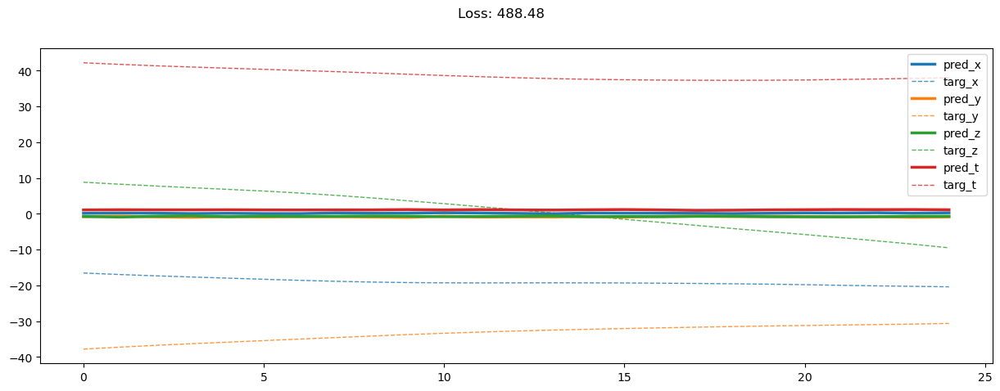

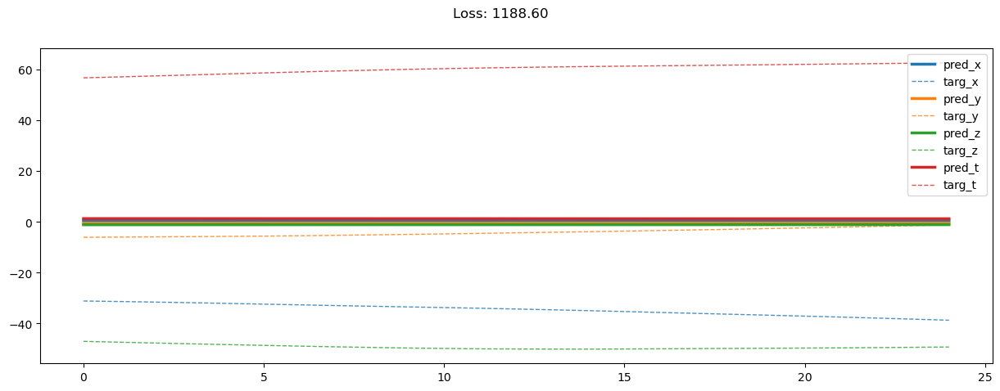

00020: train loss:  2098.861, imu loss:  0.676, mag loss:  581.422, div loss:  857.529, slim:  38.312, tlim:  39.103
       valid loss:  1306.323, imu loss:  0.484, mag loss:  575.683, div loss:  77.112, slim:  38.361, tlim:  38.788
00040: train loss:  1862.234, imu loss:  0.676, mag loss:  517.968, div loss:  752.841, slim:  35.796, tlim:  36.588
       valid loss:  1137.525, imu loss:  0.484, mag loss:  497.396, div loss:  70.284, slim:  35.663, tlim:  36.090
00060: train loss:  1603.740, imu loss:  0.677, mag loss:  440.183, div loss:  656.783, slim:  32.360, tlim:  33.157
       valid loss:  967.666, imu loss:  0.484, mag loss:  418.239, div loss:  65.897, slim:  32.083, tlim:  32.510
00080: train loss:  1314.308, imu loss:  0.675, mag loss:  360.118, div loss:  535.798, slim:  28.218, tlim:  28.993
       valid loss:  792.136, imu loss:  0.484, mag loss:  337.048, div loss:  61.438, slim:  27.764, tlim:  28.158
00100: train loss:  1065.966, imu loss:  0.678, mag loss:  284.553, di

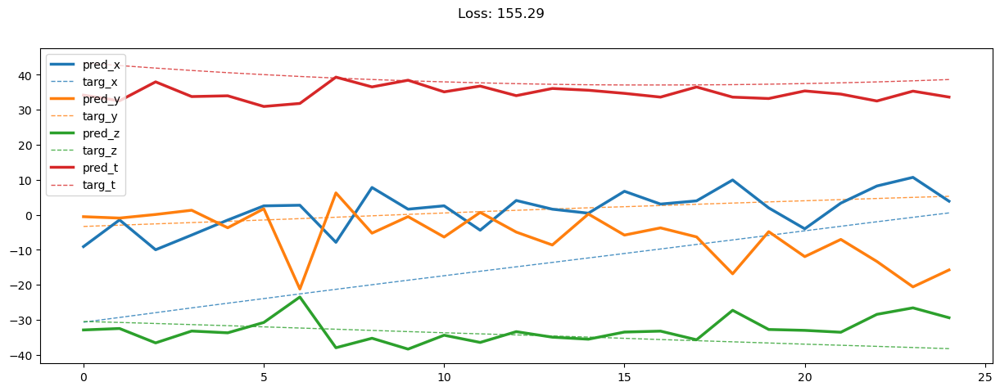

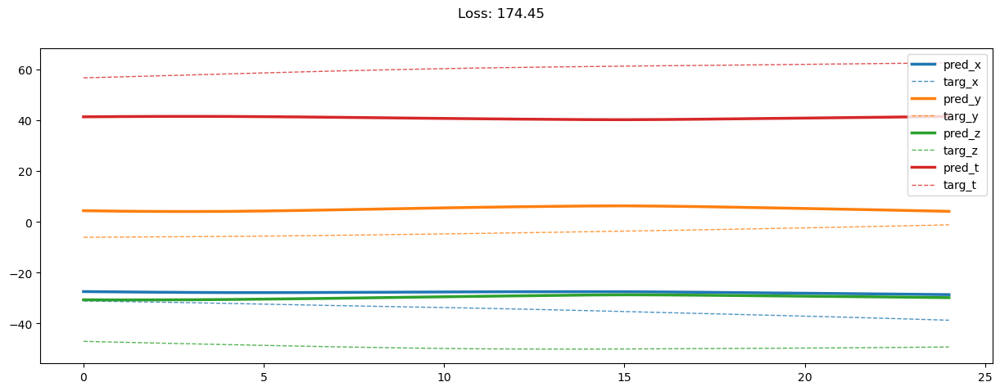

00200: train loss:  370.068, imu loss:  0.676, mag loss:  88.539, div loss:  172.626, slim:  10.296, tlim:  9.693
       valid loss:  233.128, imu loss:  0.483, mag loss:  81.582, div loss:  50.667, slim:  10.189, tlim:  9.146
00220: train loss:  327.185, imu loss:  0.677, mag loss:  77.738, div loss:  153.406, slim:  9.360, tlim:  8.631
       valid loss:  210.213, imu loss:  0.483, mag loss:  72.053, div loss:  48.570, slim:  9.384, tlim:  8.241
00240: train loss:  285.531, imu loss:  0.674, mag loss:  67.822, div loss:  134.033, slim:  8.106, tlim:  7.418
       valid loss:  184.420, imu loss:  0.482, mag loss:  62.585, div loss:  43.991, slim:  8.236, tlim:  7.105
00260: train loss:  250.688, imu loss:  0.675, mag loss:  59.640, div loss:  117.571, slim:  7.042, tlim:  6.428
       valid loss:  164.178, imu loss:  0.482, mag loss:  55.441, div loss:  39.907, slim:  7.238, tlim:  6.191
00280: train loss:  230.171, imu loss:  0.675, mag loss:  54.459, div loss:  108.779, slim:  6.333

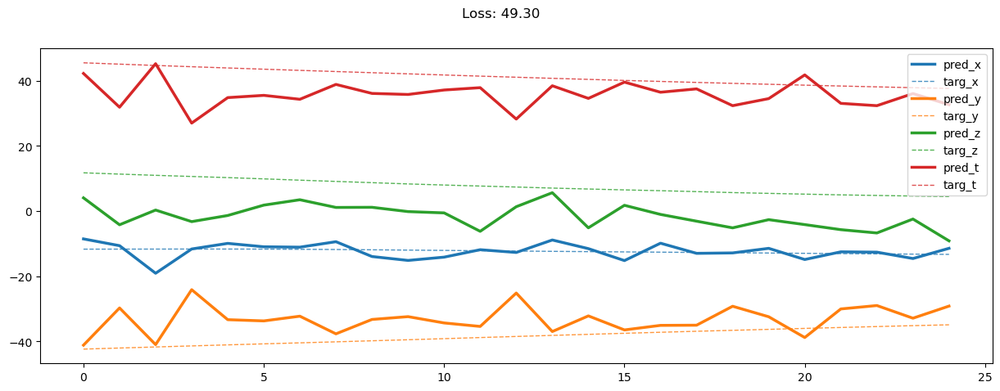

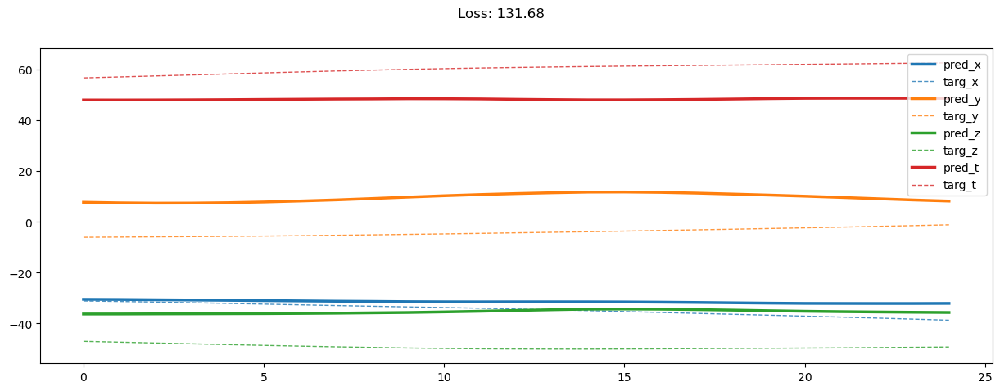

00400: train loss:  169.588, imu loss:  0.674, mag loss:  39.928, div loss:  80.350, slim:  4.834, tlim:  4.193
       valid loss:  125.792, imu loss:  0.482, mag loss:  42.167, div loss:  31.486, slim:  5.362, tlim:  4.539
00420: train loss:  164.622, imu loss:  0.676, mag loss:  38.957, div loss:  77.513, slim:  4.765, tlim:  4.091
       valid loss:  122.898, imu loss:  0.482, mag loss:  40.949, div loss:  31.292, slim:  5.256, tlim:  4.399
00440: train loss:  159.460, imu loss:  0.676, mag loss:  37.768, div loss:  74.849, slim:  4.700, tlim:  4.033
       valid loss:  120.636, imu loss:  0.481, mag loss:  39.904, div loss:  31.175, slim:  5.226, tlim:  4.373
00460: train loss:  153.735, imu loss:  0.673, mag loss:  36.271, div loss:  72.278, slim:  4.640, tlim:  3.948
       valid loss:  121.314, imu loss:  0.481, mag loss:  40.450, div loss:  30.777, slim:  5.170, tlim:  4.380
00480: train loss:  150.510, imu loss:  0.673, mag loss:  35.495, div loss:  70.682, slim:  4.581, tlim:

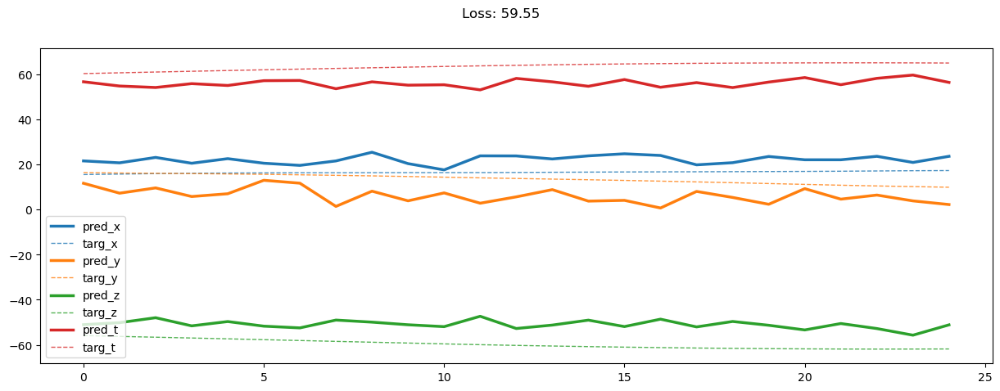

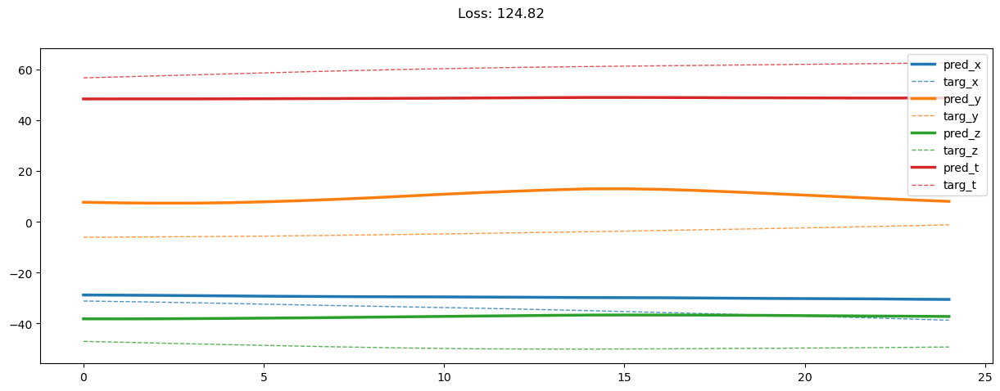

00600: train loss:  132.303, imu loss:  0.673, mag loss:  31.049, div loss:  61.859, slim:  4.435, tlim:  3.637
       valid loss:  117.185, imu loss:  0.481, mag loss:  38.997, div loss:  30.057, slim:  4.890, tlim:  4.139
00620: train loss:  131.626, imu loss:  0.672, mag loss:  30.918, div loss:  61.525, slim:  4.414, tlim:  3.591
       valid loss:  116.812, imu loss:  0.481, mag loss:  38.895, div loss:  29.920, slim:  4.914, tlim:  4.109
00640: train loss:  130.118, imu loss:  0.672, mag loss:  30.510, div loss:  60.835, slim:  4.411, tlim:  3.591
       valid loss:  115.131, imu loss:  0.481, mag loss:  38.072, div loss:  29.837, slim:  4.918, tlim:  4.140
00660: train loss:  126.350, imu loss:  0.672, mag loss:  29.679, div loss:  58.832, slim:  4.379, tlim:  3.532
       valid loss:  114.979, imu loss:  0.481, mag loss:  38.133, div loss:  29.776, slim:  4.831, tlim:  4.026
00680: train loss:  124.236, imu loss:  0.674, mag loss:  29.130, div loss:  57.873, slim:  4.326, tlim:

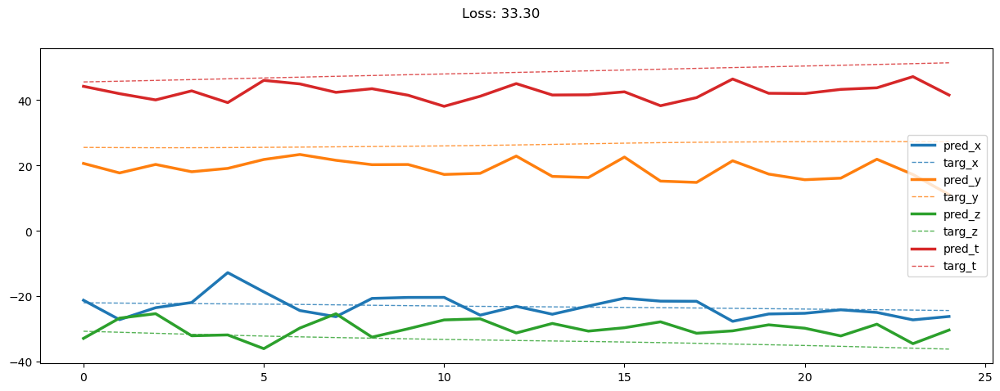

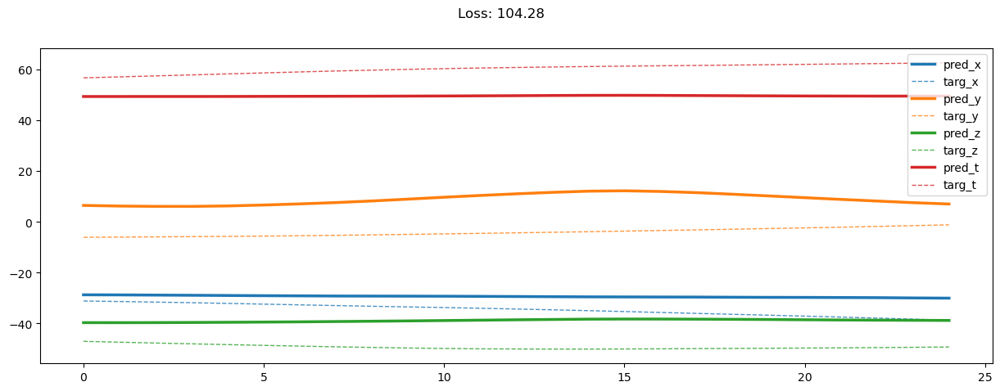

00800: train loss:  116.665, imu loss:  0.673, mag loss:  27.128, div loss:  54.479, slim:  4.274, tlim:  3.414
       valid loss:  114.306, imu loss:  0.480, mag loss:  37.807, div loss:  29.852, slim:  4.721, tlim:  3.999
00820: train loss:  113.816, imu loss:  0.674, mag loss:  26.577, div loss:  52.829, slim:  4.264, tlim:  3.351
       valid loss:  113.345, imu loss:  0.480, mag loss:  37.265, div loss:  30.051, slim:  4.713, tlim:  3.952
00840: train loss:  112.726, imu loss:  0.673, mag loss:  26.236, div loss:  52.434, slim:  4.260, tlim:  3.345
       valid loss:  113.972, imu loss:  0.480, mag loss:  37.592, div loss:  29.913, slim:  4.743, tlim:  4.016
00860: train loss:  111.133, imu loss:  0.672, mag loss:  25.837, div loss:  51.650, slim:  4.263, tlim:  3.338
       valid loss:  113.580, imu loss:  0.480, mag loss:  37.358, div loss:  30.185, slim:  4.635, tlim:  3.920
00880: train loss:  110.336, imu loss:  0.672, mag loss:  25.626, div loss:  51.301, slim:  4.249, tlim:

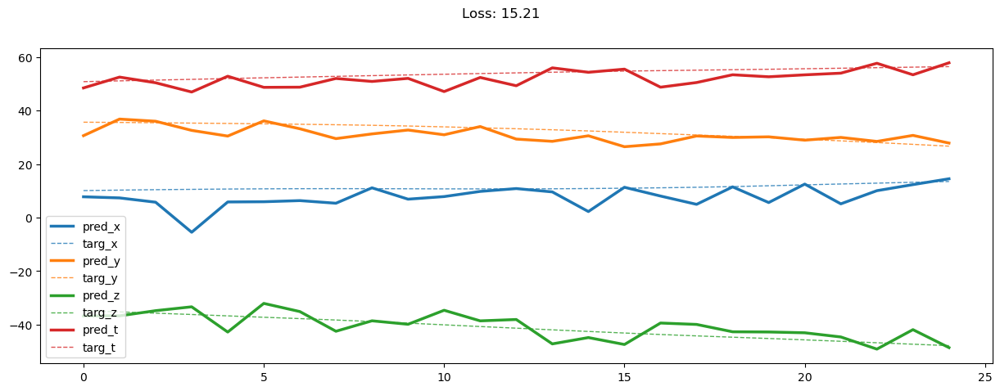

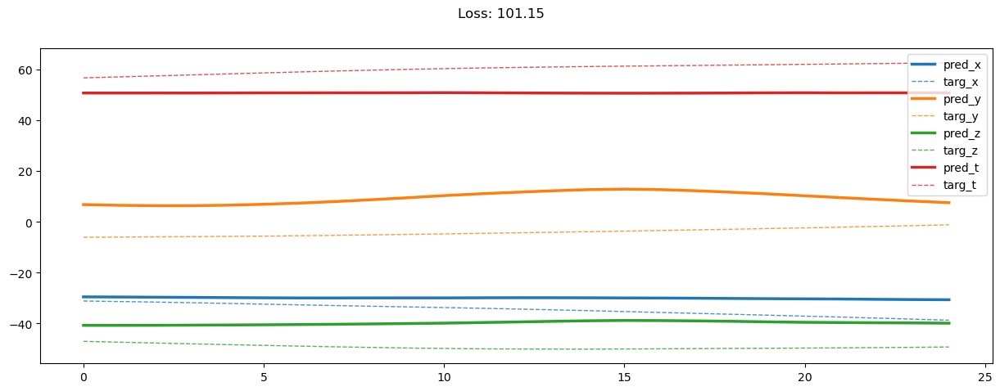

01000: train loss:  104.241, imu loss:  0.671, mag loss:  24.207, div loss:  48.234, slim:  4.171, tlim:  3.224
       valid loss:  114.551, imu loss:  0.480, mag loss:  37.725, div loss:  30.443, slim:  4.652, tlim:  3.902
01020: train loss:  102.699, imu loss:  0.672, mag loss:  23.781, div loss:  47.523, slim:  4.239, tlim:  3.216
       valid loss:  116.575, imu loss:  0.480, mag loss:  38.963, div loss:  30.032, slim:  4.558, tlim:  3.905
01040: train loss:  101.181, imu loss:  0.670, mag loss:  23.510, div loss:  46.607, slim:  4.206, tlim:  3.186
       valid loss:  113.679, imu loss:  0.480, mag loss:  37.353, div loss:  30.182, slim:  4.684, tlim:  3.979
01060: train loss:  100.868, imu loss:  0.671, mag loss:  23.378, div loss:  46.589, slim:  4.182, tlim:  3.174
       valid loss:  115.032, imu loss:  0.480, mag loss:  38.137, div loss:  30.065, slim:  4.613, tlim:  3.938
01080: train loss:  101.115, imu loss:  0.670, mag loss:  23.360, div loss:  46.859, slim:  4.189, tlim:

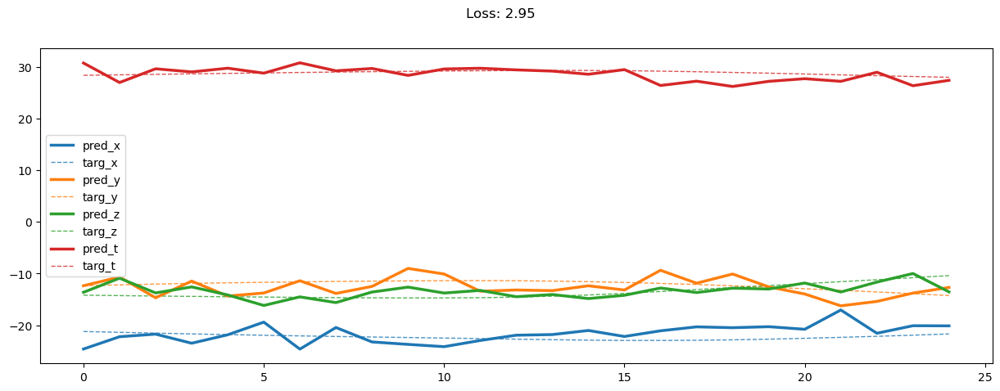

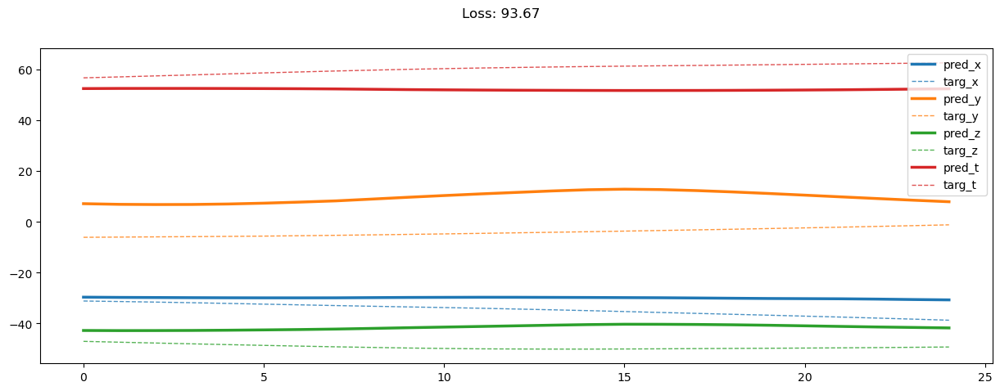

01200: train loss:  94.980, imu loss:  0.669, mag loss:  21.911, div loss:  43.732, slim:  4.196, tlim:  3.106
       valid loss:  114.639, imu loss:  0.480, mag loss:  37.899, div loss:  30.242, slim:  4.559, tlim:  3.893
01220: train loss:  94.238, imu loss:  0.670, mag loss:  21.760, div loss:  43.319, slim:  4.163, tlim:  3.098
       valid loss:  113.839, imu loss:  0.480, mag loss:  37.358, div loss:  30.442, slim:  4.609, tlim:  3.932
01240: train loss:  94.051, imu loss:  0.670, mag loss:  21.734, div loss:  43.204, slim:  4.162, tlim:  3.086
       valid loss:  113.224, imu loss:  0.479, mag loss:  37.081, div loss:  30.496, slim:  4.528, tlim:  3.882
01260: train loss:  92.883, imu loss:  0.670, mag loss:  21.419, div loss:  42.664, slim:  4.201, tlim:  3.073
       valid loss:  113.305, imu loss:  0.479, mag loss:  37.175, div loss:  30.356, slim:  4.545, tlim:  3.897
01280: train loss:  92.658, imu loss:  0.670, mag loss:  21.364, div loss:  42.565, slim:  4.170, tlim:  3.0

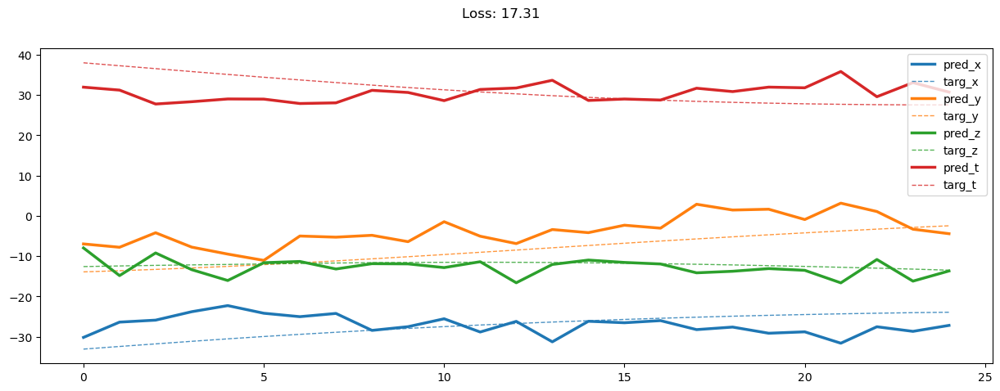

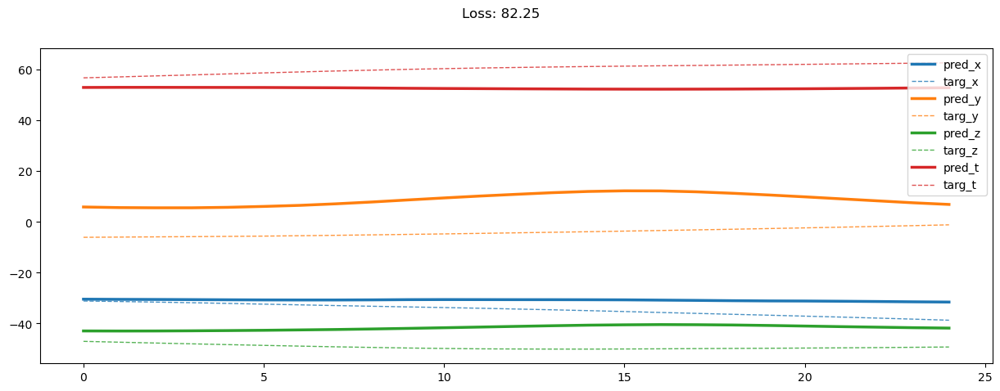

01400: train loss:  88.904, imu loss:  0.669, mag loss:  20.402, div loss:  40.829, slim:  4.157, tlim:  3.016
       valid loss:  113.232, imu loss:  0.479, mag loss:  36.994, div loss:  30.803, slim:  4.473, tlim:  3.816
01420: train loss:  87.757, imu loss:  0.671, mag loss:  20.122, div loss:  40.262, slim:  4.155, tlim:  3.002
       valid loss:  115.174, imu loss:  0.479, mag loss:  37.890, div loss:  30.867, slim:  4.537, tlim:  3.852
01440: train loss:  87.744, imu loss:  0.670, mag loss:  20.162, div loss:  40.182, slim:  4.154, tlim:  2.994
       valid loss:  115.077, imu loss:  0.479, mag loss:  37.964, div loss:  30.414, slim:  4.622, tlim:  3.963
01460: train loss:  86.400, imu loss:  0.669, mag loss:  19.819, div loss:  39.545, slim:  4.183, tlim:  2.971
       valid loss:  115.542, imu loss:  0.479, mag loss:  38.042, div loss:  30.856, slim:  4.555, tlim:  3.897
01480: train loss:  86.799, imu loss:  0.670, mag loss:  19.908, div loss:  39.770, slim:  4.180, tlim:  2.9

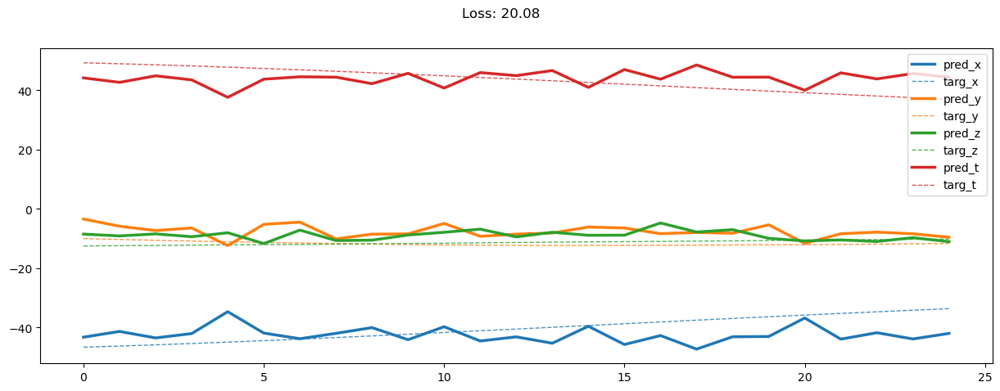

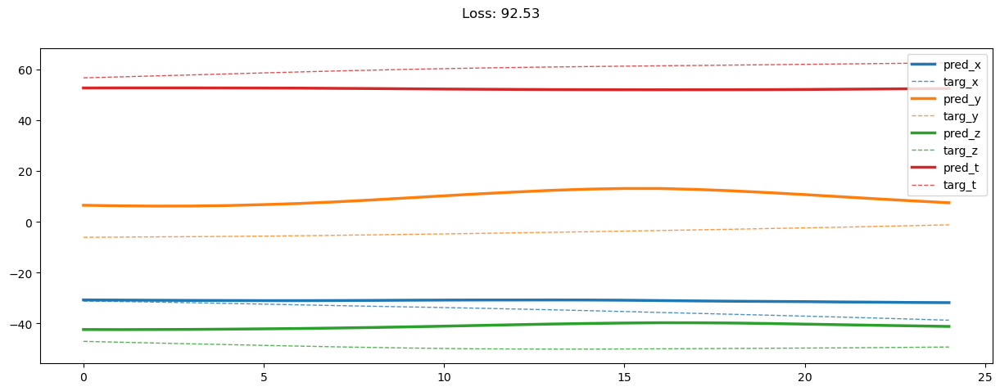

01600: train loss:  83.817, imu loss:  0.668, mag loss:  19.189, div loss:  38.306, slim:  4.110, tlim:  2.940
       valid loss:  114.575, imu loss:  0.479, mag loss:  37.405, div loss:  31.271, slim:  4.504, tlim:  3.842
01620: train loss:  82.989, imu loss:  0.670, mag loss:  18.984, div loss:  37.925, slim:  4.121, tlim:  2.911
       valid loss:  116.121, imu loss:  0.479, mag loss:  38.146, div loss:  31.263, slim:  4.535, tlim:  3.880
01640: train loss:  82.579, imu loss:  0.669, mag loss:  18.903, div loss:  37.662, slim:  4.154, tlim:  2.910
       valid loss:  114.428, imu loss:  0.479, mag loss:  37.525, div loss:  30.870, slim:  4.522, tlim:  3.845
01660: train loss:  82.166, imu loss:  0.668, mag loss:  18.781, div loss:  37.487, slim:  4.153, tlim:  2.914
       valid loss:  114.591, imu loss:  0.479, mag loss:  37.429, div loss:  31.311, slim:  4.476, tlim:  3.804
01680: train loss:  81.716, imu loss:  0.669, mag loss:  18.676, div loss:  37.300, slim:  4.137, tlim:  2.8

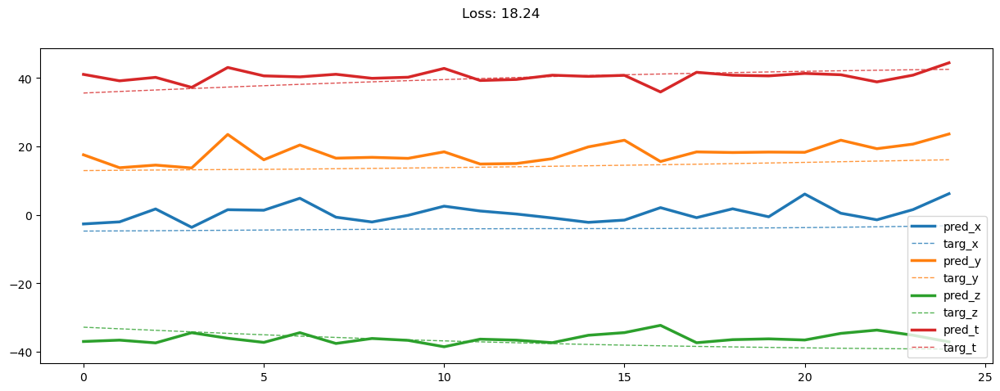

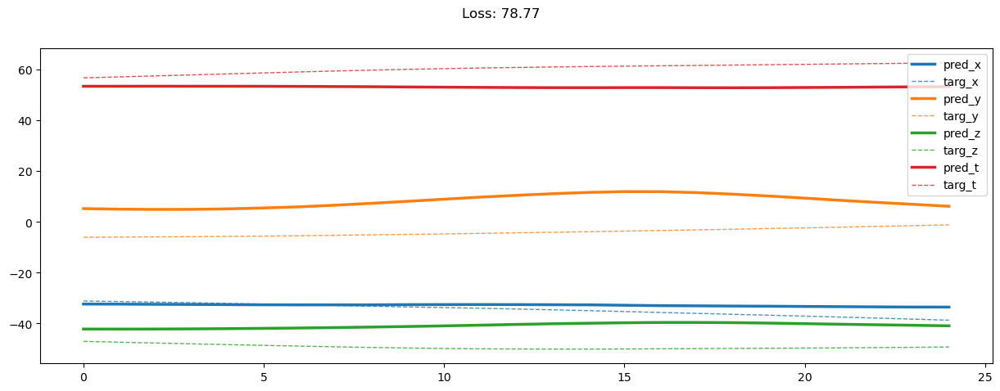

01800: train loss:  78.303, imu loss:  0.668, mag loss:  17.892, div loss:  35.512, slim:  4.139, tlim:  2.846
       valid loss:  112.908, imu loss:  0.479, mag loss:  36.531, div loss:  31.376, slim:  4.456, tlim:  3.842
01820: train loss:  77.898, imu loss:  0.667, mag loss:  17.806, div loss:  35.275, slim:  4.147, tlim:  2.847
       valid loss:  114.256, imu loss:  0.479, mag loss:  37.175, div loss:  31.408, slim:  4.492, tlim:  3.849
01840: train loss:  78.339, imu loss:  0.668, mag loss:  17.827, div loss:  35.692, slim:  4.151, tlim:  2.833
       valid loss:  114.417, imu loss:  0.479, mag loss:  37.262, div loss:  31.406, slim:  4.481, tlim:  3.845
01860: train loss:  76.970, imu loss:  0.670, mag loss:  17.550, div loss:  34.895, slim:  4.122, tlim:  2.829
       valid loss:  114.373, imu loss:  0.479, mag loss:  37.307, div loss:  31.264, slim:  4.455, tlim:  3.858
01880: train loss:  77.604, imu loss:  0.668, mag loss:  17.631, div loss:  35.360, slim:  4.138, tlim:  2.8

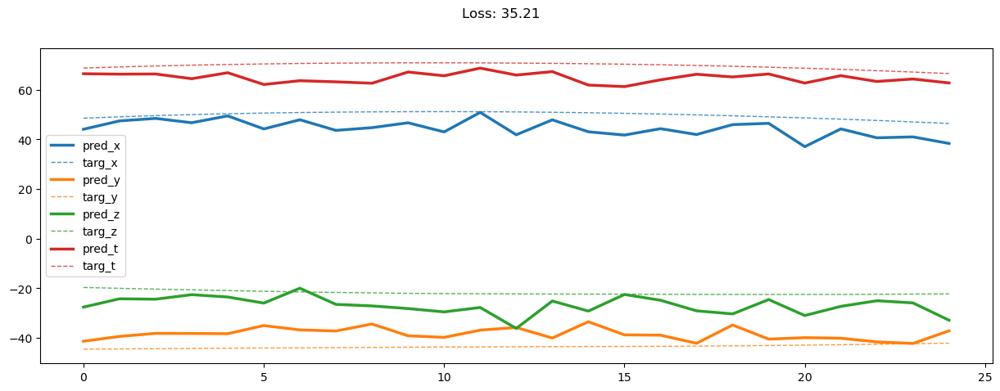

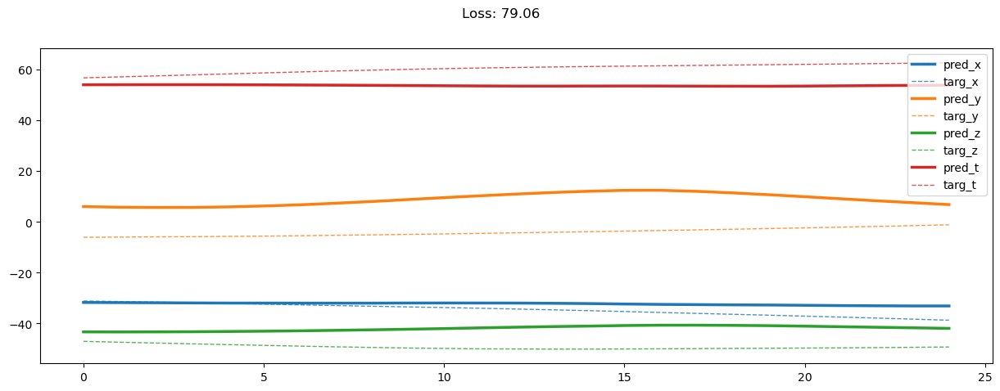

02000: train loss:  75.383, imu loss:  0.666, mag loss:  17.103, div loss:  34.249, slim:  4.146, tlim:  2.793
       valid loss:  113.663, imu loss:  0.479, mag loss:  36.708, div loss:  31.757, slim:  4.440, tlim:  3.862
02020: train loss:  75.102, imu loss:  0.668, mag loss:  17.027, div loss:  34.110, slim:  4.164, tlim:  2.793
       valid loss:  115.259, imu loss:  0.479, mag loss:  37.468, div loss:  31.920, slim:  4.412, tlim:  3.813
02040: train loss:  74.597, imu loss:  0.668, mag loss:  16.865, div loss:  33.979, slim:  4.117, tlim:  2.774
       valid loss:  115.730, imu loss:  0.479, mag loss:  37.588, div loss:  32.164, slim:  4.424, tlim:  3.800
02060: train loss:  73.880, imu loss:  0.667, mag loss:  16.743, div loss:  33.503, slim:  4.145, tlim:  2.768
       valid loss:  115.928, imu loss:  0.479, mag loss:  37.753, div loss:  31.922, slim:  4.482, tlim:  3.853
02080: train loss:  74.004, imu loss:  0.668, mag loss:  16.778, div loss:  33.566, slim:  4.139, tlim:  2.7

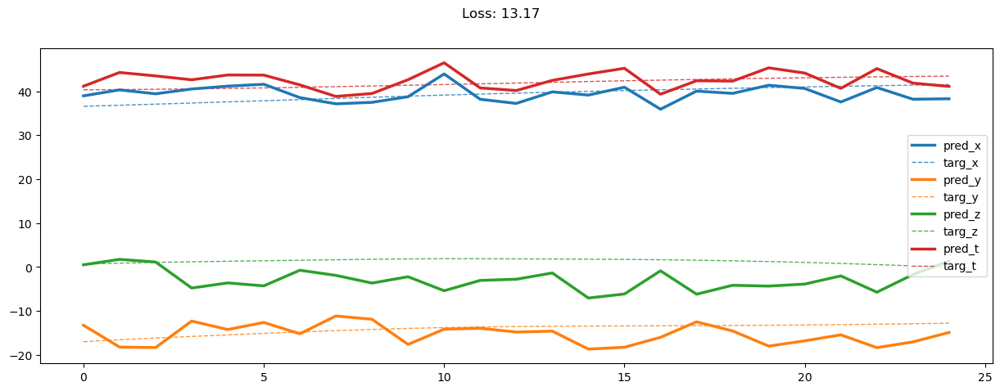

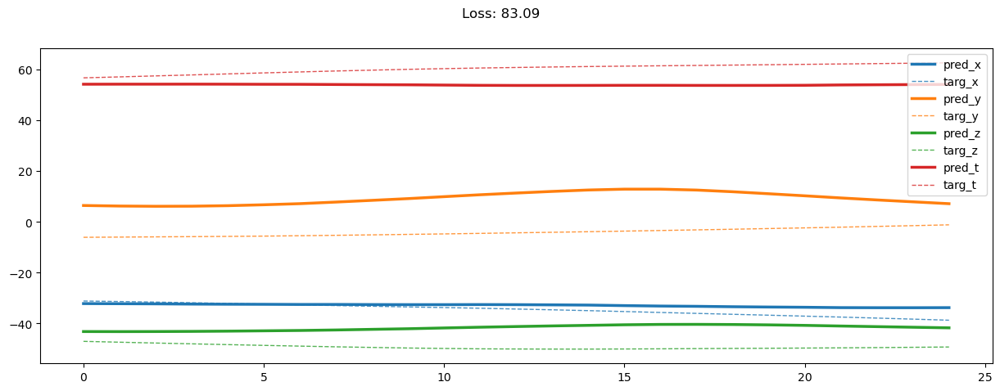

02200: train loss:  71.411, imu loss:  0.666, mag loss:  16.166, div loss:  32.253, slim:  4.120, tlim:  2.732
       valid loss:  115.137, imu loss:  0.479, mag loss:  37.190, div loss:  32.276, slim:  4.458, tlim:  3.848
02220: train loss:  71.436, imu loss:  0.666, mag loss:  16.177, div loss:  32.242, slim:  4.137, tlim:  2.736
       valid loss:  113.480, imu loss:  0.479, mag loss:  36.426, div loss:  32.213, slim:  4.422, tlim:  3.816
02240: train loss:  71.163, imu loss:  0.666, mag loss:  16.081, div loss:  32.181, slim:  4.125, tlim:  2.727
       valid loss:  116.138, imu loss:  0.479, mag loss:  37.650, div loss:  32.366, slim:  4.469, tlim:  3.839
02260: train loss:  70.593, imu loss:  0.666, mag loss:  15.969, div loss:  31.862, slim:  4.127, tlim:  2.710
       valid loss:  115.125, imu loss:  0.479, mag loss:  37.105, div loss:  32.463, slim:  4.435, tlim:  3.838
02280: train loss:  70.254, imu loss:  0.665, mag loss:  15.848, div loss:  31.756, slim:  4.119, tlim:  2.7

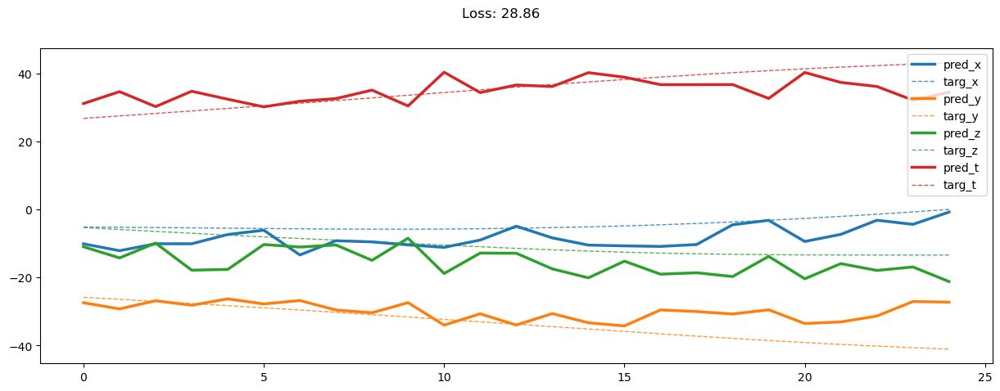

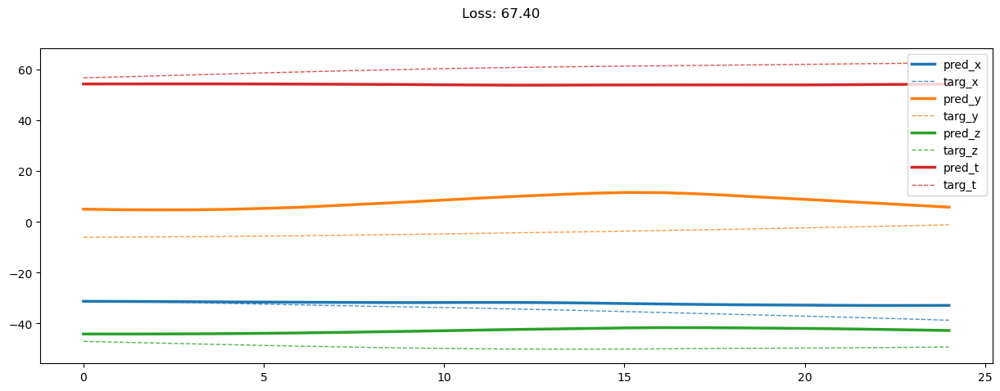

02400: train loss:  68.371, imu loss:  0.667, mag loss:  15.442, div loss:  30.748, slim:  4.140, tlim:  2.668
       valid loss:  115.809, imu loss:  0.479, mag loss:  37.464, div loss:  32.510, slim:  4.414, tlim:  3.790
02420: train loss:  68.857, imu loss:  0.665, mag loss:  15.533, div loss:  31.036, slim:  4.148, tlim:  2.678
       valid loss:  116.426, imu loss:  0.479, mag loss:  37.667, div loss:  32.638, slim:  4.444, tlim:  3.835
02440: train loss:  67.616, imu loss:  0.665, mag loss:  15.263, div loss:  30.367, slim:  4.117, tlim:  2.666
       valid loss:  117.173, imu loss:  0.479, mag loss:  37.914, div loss:  32.835, slim:  4.465, tlim:  3.866
02460: train loss:  67.729, imu loss:  0.665, mag loss:  15.228, div loss:  30.557, slim:  4.113, tlim:  2.663
       valid loss:  116.302, imu loss:  0.479, mag loss:  37.620, div loss:  32.619, slim:  4.420, tlim:  3.835
02480: train loss:  67.068, imu loss:  0.665, mag loss:  15.133, div loss:  30.094, slim:  4.145, tlim:  2.6

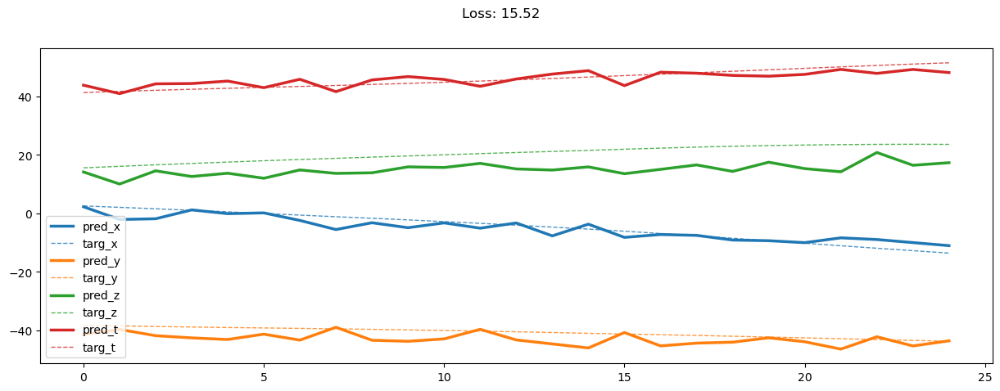

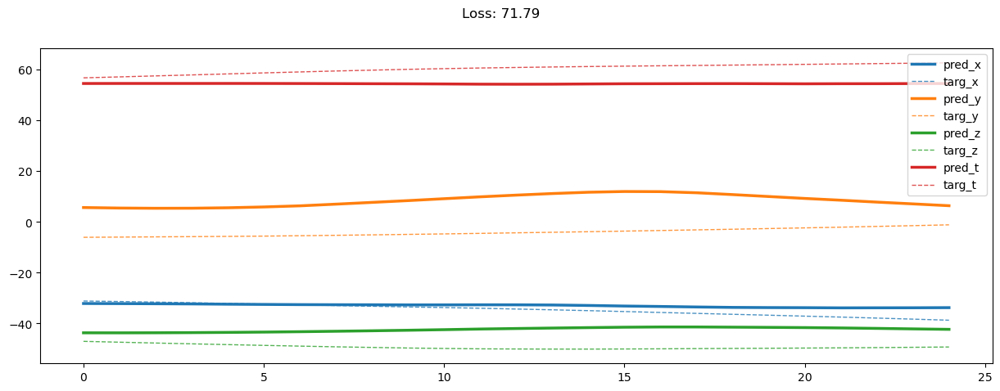

02600: train loss:  65.997, imu loss:  0.666, mag loss:  14.893, div loss:  29.523, slim:  4.141, tlim:  2.634
       valid loss:  116.635, imu loss:  0.478, mag loss:  37.561, div loss:  33.062, slim:  4.429, tlim:  3.838
02620: train loss:  66.158, imu loss:  0.665, mag loss:  14.876, div loss:  29.721, slim:  4.133, tlim:  2.635
       valid loss:  116.021, imu loss:  0.478, mag loss:  37.398, div loss:  32.884, slim:  4.375, tlim:  3.784
02640: train loss:  65.147, imu loss:  0.665, mag loss:  14.656, div loss:  29.156, slim:  4.133, tlim:  2.632
       valid loss:  116.861, imu loss:  0.478, mag loss:  37.714, div loss:  33.119, slim:  4.363, tlim:  3.769
02660: train loss:  64.985, imu loss:  0.664, mag loss:  14.592, div loss:  29.172, slim:  4.139, tlim:  2.597
       valid loss:  116.822, imu loss:  0.478, mag loss:  37.681, div loss:  33.089, slim:  4.365, tlim:  3.807
02680: train loss:  64.707, imu loss:  0.665, mag loss:  14.546, div loss:  28.959, slim:  4.163, tlim:  2.6

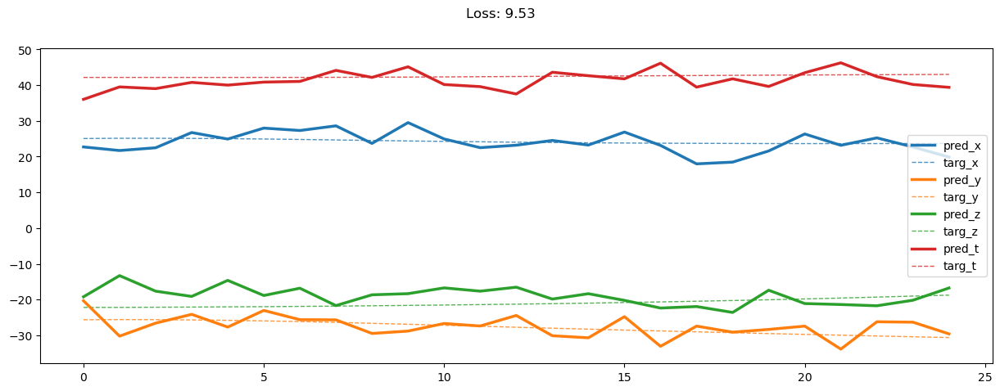

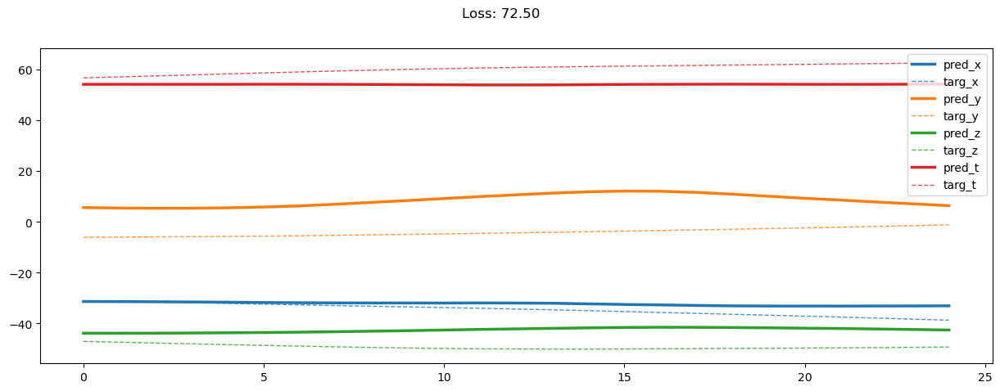

02800: train loss:  63.785, imu loss:  0.665, mag loss:  14.304, div loss:  28.556, slim:  4.134, tlim:  2.593
       valid loss:  118.424, imu loss:  0.478, mag loss:  38.118, div loss:  33.720, slim:  4.412, tlim:  3.856
02820: train loss:  63.412, imu loss:  0.665, mag loss:  14.202, div loss:  28.403, slim:  4.134, tlim:  2.582
       valid loss:  116.873, imu loss:  0.478, mag loss:  37.665, div loss:  33.130, slim:  4.400, tlim:  3.824
02840: train loss:  63.259, imu loss:  0.664, mag loss:  14.142, div loss:  28.378, slim:  4.143, tlim:  2.575
       valid loss:  116.956, imu loss:  0.478, mag loss:  37.585, div loss:  33.356, slim:  4.395, tlim:  3.836
02860: train loss:  63.183, imu loss:  0.664, mag loss:  14.156, div loss:  28.283, slim:  4.126, tlim:  2.574
       valid loss:  117.854, imu loss:  0.478, mag loss:  37.941, div loss:  33.590, slim:  4.399, tlim:  3.803
02880: train loss:  62.346, imu loss:  0.665, mag loss:  13.958, div loss:  27.849, slim:  4.137, tlim:  2.5

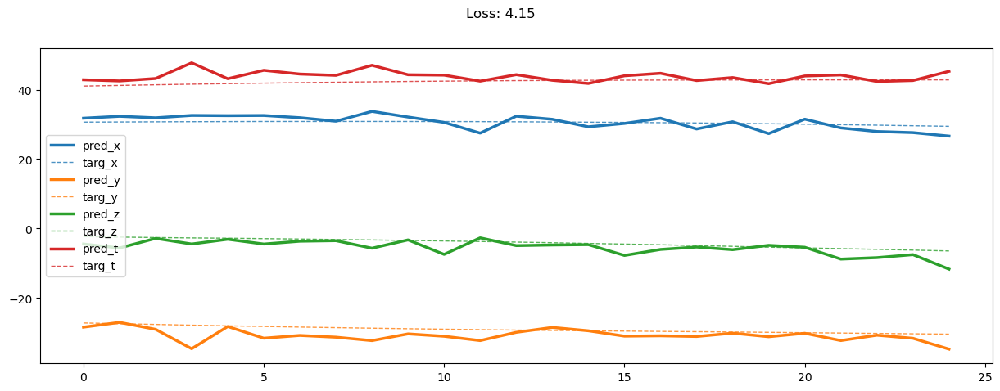

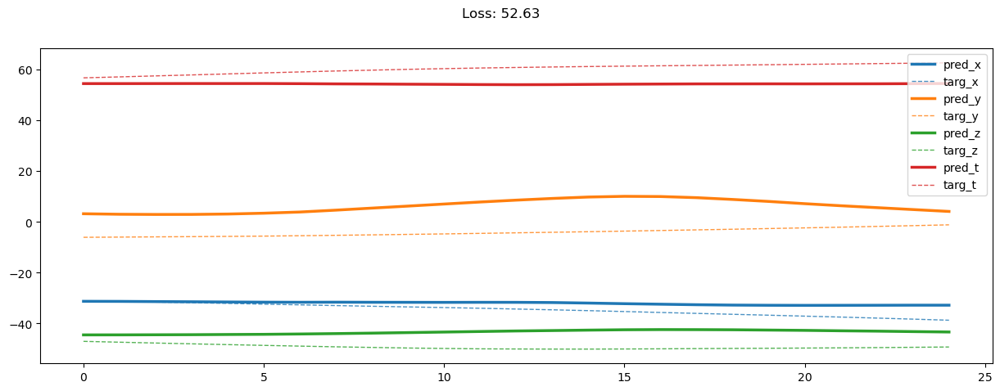

03000: train loss:  61.296, imu loss:  0.664, mag loss:  13.698, div loss:  27.377, slim:  4.135, tlim:  2.528
       valid loss:  117.969, imu loss:  0.478, mag loss:  37.922, div loss:  33.722, slim:  4.377, tlim:  3.824
03020: train loss:  61.087, imu loss:  0.663, mag loss:  13.663, div loss:  27.226, slim:  4.140, tlim:  2.535
       valid loss:  118.063, imu loss:  0.478, mag loss:  37.999, div loss:  33.792, slim:  4.321, tlim:  3.757
03040: train loss:  60.853, imu loss:  0.664, mag loss:  13.589, div loss:  27.148, slim:  4.132, tlim:  2.532
       valid loss:  118.551, imu loss:  0.478, mag loss:  38.162, div loss:  33.838, slim:  4.391, tlim:  3.810
03060: train loss:  60.860, imu loss:  0.663, mag loss:  13.574, div loss:  27.191, slim:  4.131, tlim:  2.528
       valid loss:  118.671, imu loss:  0.478, mag loss:  38.118, div loss:  33.970, slim:  4.424, tlim:  3.851
03080: train loss:  60.854, imu loss:  0.663, mag loss:  13.581, div loss:  27.165, slim:  4.130, tlim:  2.5

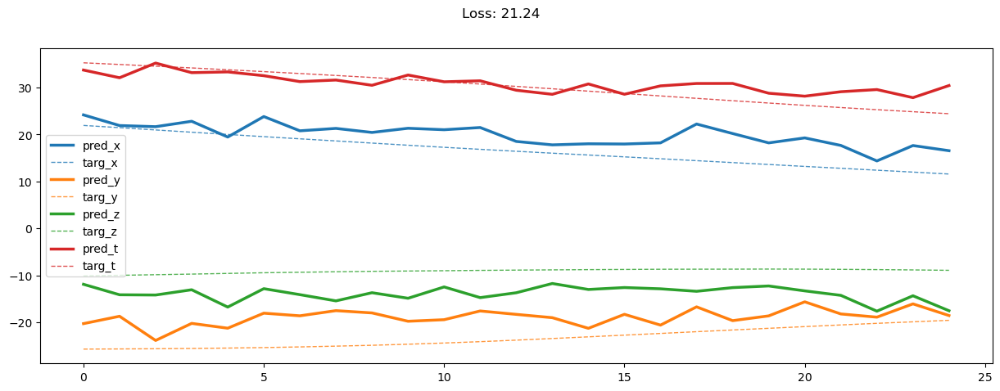

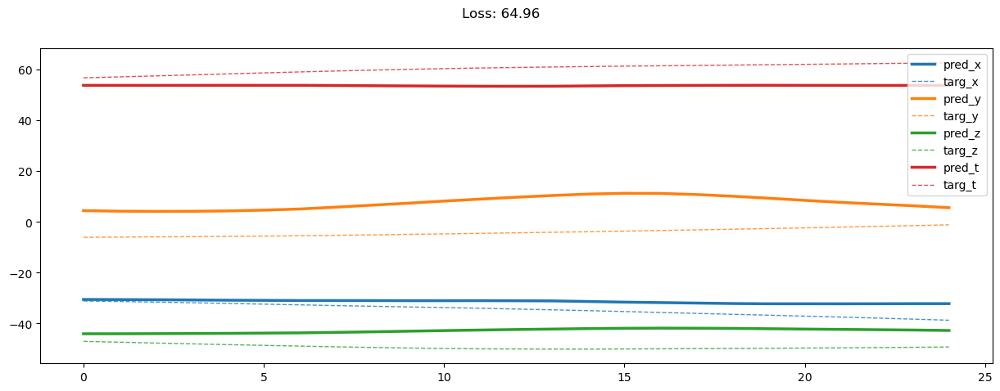

03200: train loss:  59.348, imu loss:  0.664, mag loss:  13.247, div loss:  26.359, slim:  4.146, tlim:  2.506
       valid loss:  118.253, imu loss:  0.478, mag loss:  37.999, div loss:  33.870, slim:  4.379, tlim:  3.813
03220: train loss:  58.882, imu loss:  0.664, mag loss:  13.130, div loss:  26.148, slim:  4.143, tlim:  2.493
       valid loss:  117.830, imu loss:  0.478, mag loss:  37.897, div loss:  33.686, slim:  4.360, tlim:  3.794
03240: train loss:  59.031, imu loss:  0.665, mag loss:  13.090, div loss:  26.376, slim:  4.149, tlim:  2.491
       valid loss:  118.383, imu loss:  0.478, mag loss:  38.114, div loss:  33.794, slim:  4.375, tlim:  3.798
03260: train loss:  58.784, imu loss:  0.663, mag loss:  13.077, div loss:  26.167, slim:  4.136, tlim:  2.488
       valid loss:  117.559, imu loss:  0.478, mag loss:  37.676, div loss:  33.908, slim:  4.296, tlim:  3.782
03280: train loss:  58.706, imu loss:  0.663, mag loss:  13.039, div loss:  26.165, slim:  4.153, tlim:  2.4

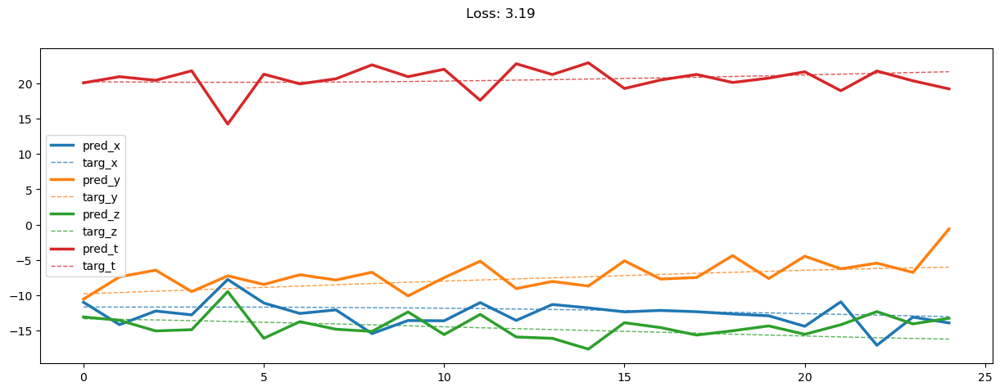

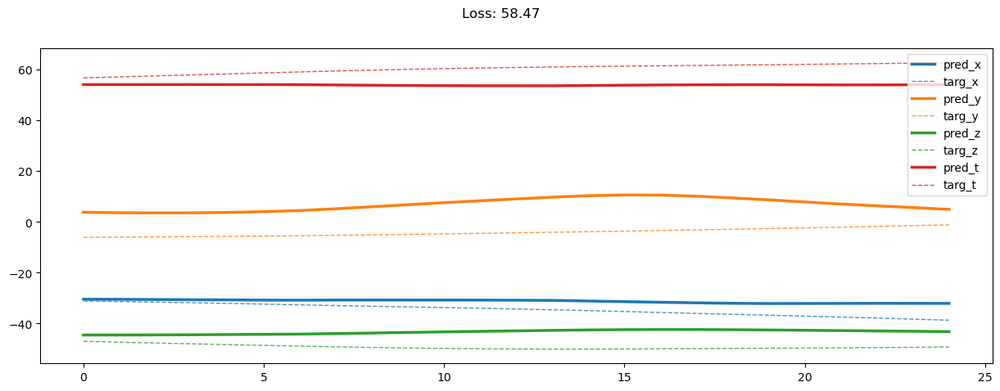

03400: train loss:  57.866, imu loss:  0.664, mag loss:  12.859, div loss:  25.704, slim:  4.161, tlim:  2.466
       valid loss:  117.878, imu loss:  0.478, mag loss:  37.828, div loss:  33.845, slim:  4.341, tlim:  3.820
03420: train loss:  57.615, imu loss:  0.663, mag loss:  12.773, div loss:  25.640, slim:  4.156, tlim:  2.459
       valid loss:  119.342, imu loss:  0.478, mag loss:  38.491, div loss:  33.976, slim:  4.377, tlim:  3.812
03440: train loss:  56.762, imu loss:  0.662, mag loss:  12.585, div loss:  25.200, slim:  4.127, tlim:  2.444
       valid loss:  118.471, imu loss:  0.478, mag loss:  38.020, div loss:  34.088, slim:  4.334, tlim:  3.799
03460: train loss:  56.833, imu loss:  0.664, mag loss:  12.629, div loss:  25.147, slim:  4.150, tlim:  2.459
       valid loss:  118.795, imu loss:  0.478, mag loss:  38.167, div loss:  34.081, slim:  4.381, tlim:  3.808
03480: train loss:  57.144, imu loss:  0.664, mag loss:  12.672, div loss:  25.381, slim:  4.145, tlim:  2.4

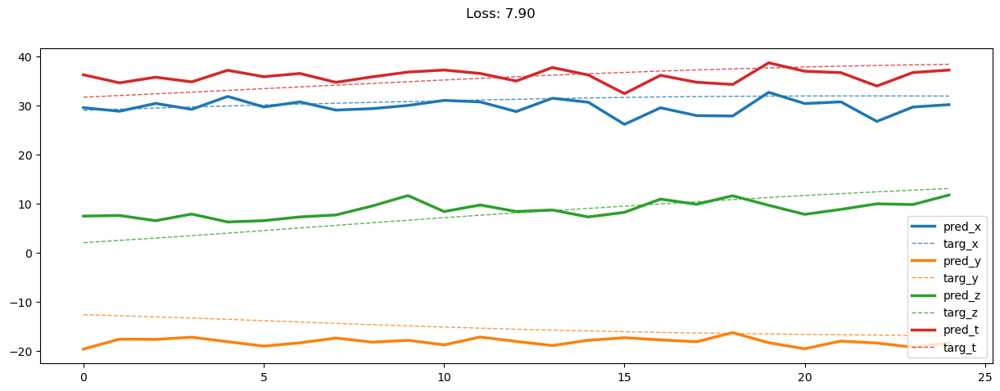

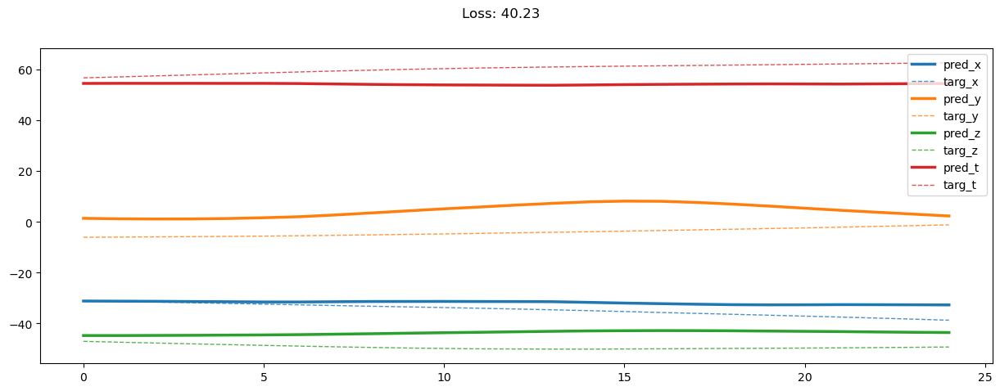

03600: train loss:  56.036, imu loss:  0.665, mag loss:  12.418, div loss:  24.844, slim:  4.108, tlim:  2.424
       valid loss:  118.372, imu loss:  0.477, mag loss:  38.048, div loss:  33.947, slim:  4.344, tlim:  3.787
03620: train loss:  55.745, imu loss:  0.662, mag loss:  12.311, div loss:  24.747, slim:  4.160, tlim:  2.423
       valid loss:  118.735, imu loss:  0.477, mag loss:  38.107, div loss:  34.236, slim:  4.311, tlim:  3.768
03640: train loss:  55.086, imu loss:  0.664, mag loss:  12.199, div loss:  24.319, slim:  4.165, tlim:  2.415
       valid loss:  119.183, imu loss:  0.478, mag loss:  38.359, div loss:  34.108, slim:  4.342, tlim:  3.805
03660: train loss:  55.535, imu loss:  0.661, mag loss:  12.312, div loss:  24.537, slim:  4.165, tlim:  2.420
       valid loss:  118.009, imu loss:  0.478, mag loss:  37.758, div loss:  34.259, slim:  4.282, tlim:  3.743
03680: train loss:  55.590, imu loss:  0.662, mag loss:  12.321, div loss:  24.595, slim:  4.153, tlim:  2.4

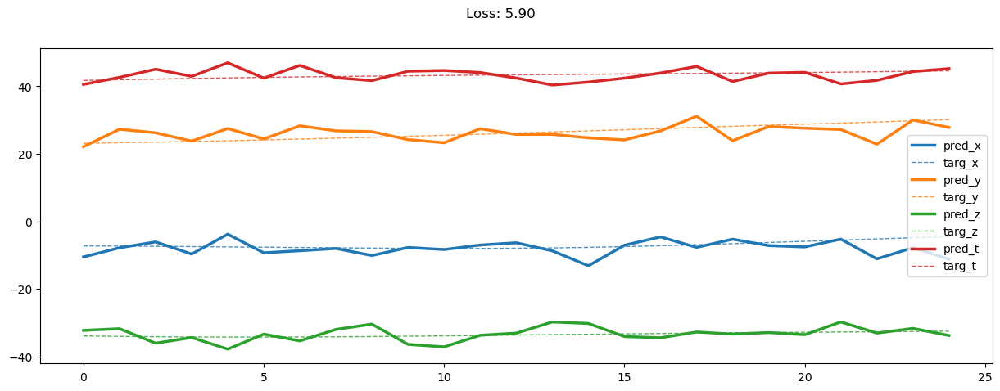

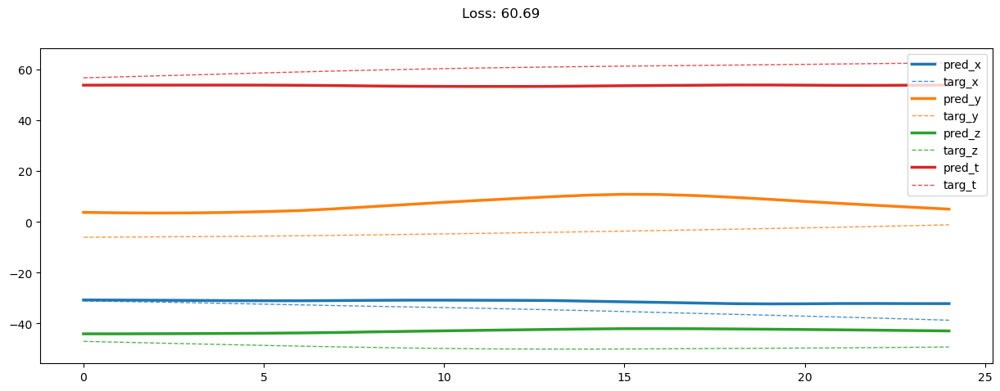

03800: train loss:  54.050, imu loss:  0.664, mag loss:  11.934, div loss:  23.860, slim:  4.153, tlim:  2.387
       valid loss:  118.194, imu loss:  0.477, mag loss:  37.917, div loss:  34.029, slim:  4.321, tlim:  3.795
03820: train loss:  53.791, imu loss:  0.663, mag loss:  11.891, div loss:  23.691, slim:  4.160, tlim:  2.382
       valid loss:  118.298, imu loss:  0.478, mag loss:  37.823, div loss:  34.348, slim:  4.324, tlim:  3.777
03840: train loss:  53.844, imu loss:  0.663, mag loss:  11.907, div loss:  23.728, slim:  4.157, tlim:  2.373
       valid loss:  119.956, imu loss:  0.477, mag loss:  38.522, div loss:  34.571, slim:  4.307, tlim:  3.807
03860: train loss:  53.738, imu loss:  0.662, mag loss:  11.859, div loss:  23.708, slim:  4.147, tlim:  2.385
       valid loss:  119.347, imu loss:  0.477, mag loss:  38.415, div loss:  34.248, slim:  4.254, tlim:  3.775
03880: train loss:  53.458, imu loss:  0.663, mag loss:  11.830, div loss:  23.517, slim:  4.150, tlim:  2.3

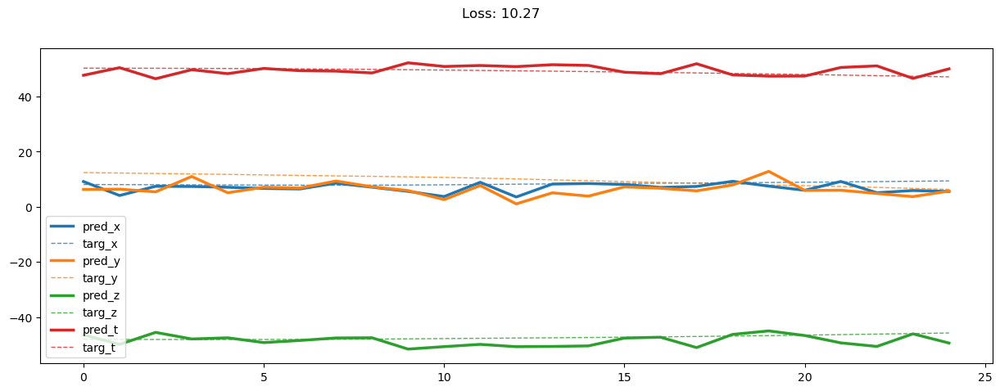

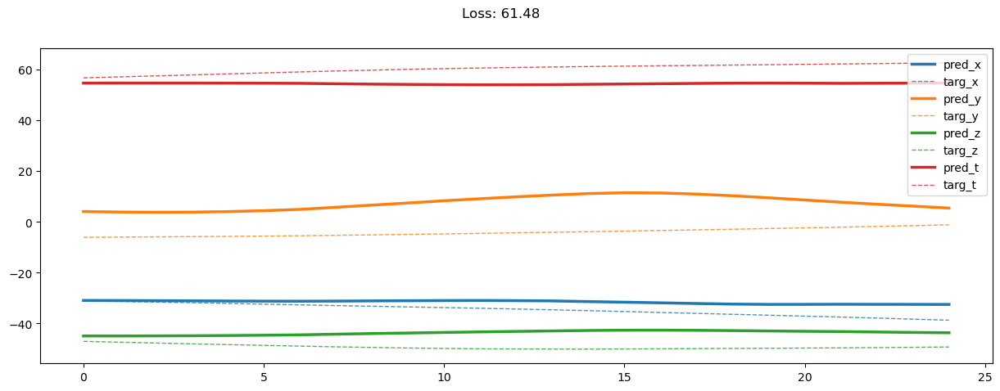

04000: train loss:  53.306, imu loss:  0.664, mag loss:  11.728, div loss:  23.567, slim:  4.172, tlim:  2.356
       valid loss:  119.401, imu loss:  0.477, mag loss:  38.410, div loss:  34.320, slim:  4.278, tlim:  3.764
04020: train loss:  52.756, imu loss:  0.663, mag loss:  11.627, div loss:  23.236, slim:  4.143, tlim:  2.354
       valid loss:  119.093, imu loss:  0.477, mag loss:  38.166, div loss:  34.451, slim:  4.293, tlim:  3.790
04040: train loss:  52.514, imu loss:  0.661, mag loss:  11.593, div loss:  23.063, slim:  4.168, tlim:  2.348
       valid loss:  120.420, imu loss:  0.477, mag loss:  38.734, div loss:  34.647, slim:  4.313, tlim:  3.781
04060: train loss:  52.635, imu loss:  0.662, mag loss:  11.578, div loss:  23.225, slim:  4.132, tlim:  2.351
       valid loss:  119.552, imu loss:  0.477, mag loss:  38.477, div loss:  34.285, slim:  4.327, tlim:  3.782
04080: train loss:  52.513, imu loss:  0.661, mag loss:  11.567, div loss:  23.140, slim:  4.139, tlim:  2.3

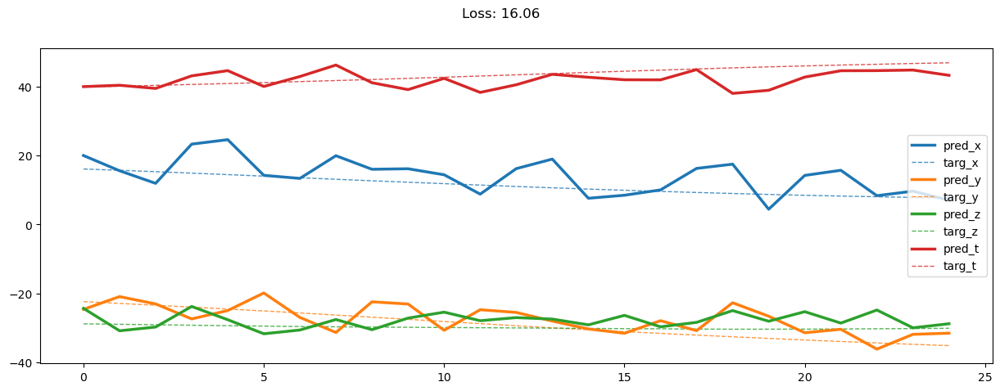

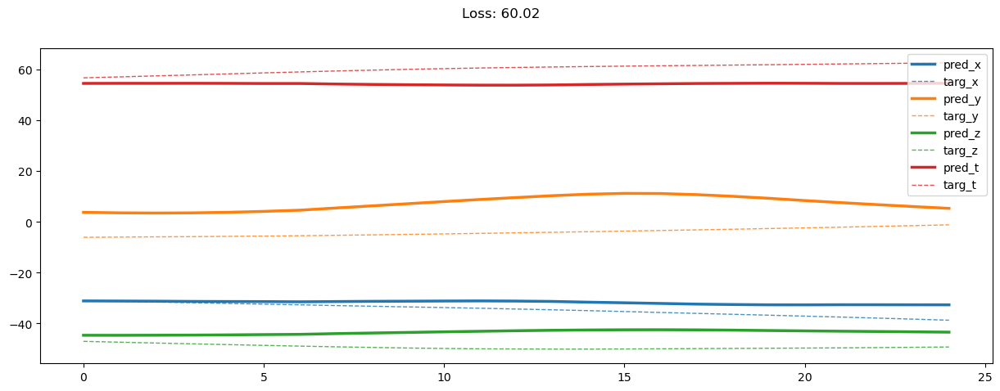

04200: train loss:  51.526, imu loss:  0.662, mag loss:  11.324, div loss:  22.658, slim:  4.140, tlim:  2.325
       valid loss:  119.155, imu loss:  0.477, mag loss:  38.307, div loss:  34.233, slim:  4.314, tlim:  3.783
04220: train loss:  51.359, imu loss:  0.661, mag loss:  11.294, div loss:  22.554, slim:  4.157, tlim:  2.317
       valid loss:  119.346, imu loss:  0.477, mag loss:  38.333, div loss:  34.381, slim:  4.311, tlim:  3.777
04240: train loss:  51.358, imu loss:  0.664, mag loss:  11.315, div loss:  22.515, slim:  4.166, tlim:  2.311
       valid loss:  119.109, imu loss:  0.478, mag loss:  38.244, div loss:  34.306, slim:  4.309, tlim:  3.789
04260: train loss:  51.121, imu loss:  0.662, mag loss:  11.209, div loss:  22.492, slim:  4.157, tlim:  2.314
       valid loss:  119.295, imu loss:  0.478, mag loss:  38.372, div loss:  34.230, slim:  4.331, tlim:  3.786
04280: train loss:  50.938, imu loss:  0.662, mag loss:  11.201, div loss:  22.324, slim:  4.165, tlim:  2.3

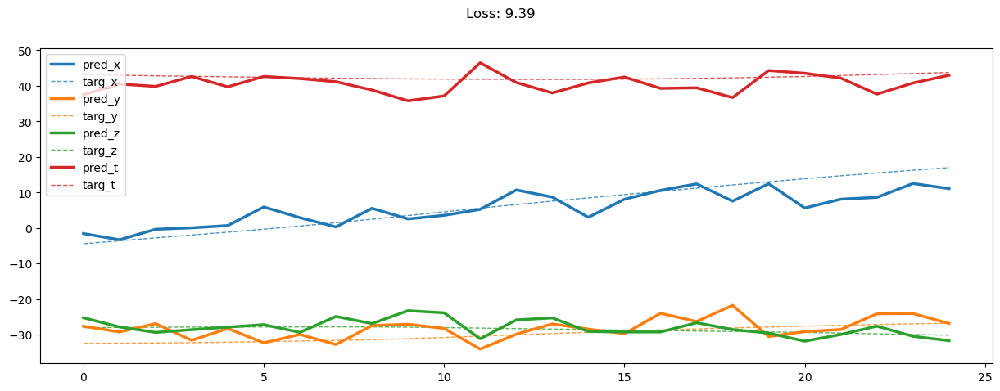

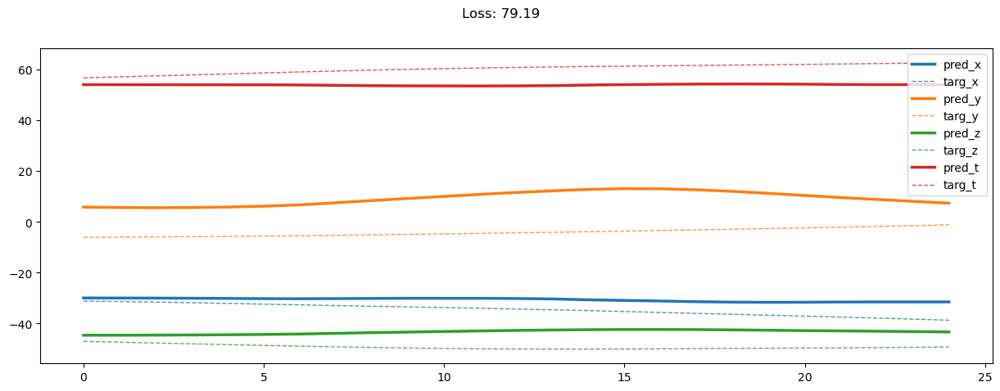

04400: train loss:  50.122, imu loss:  0.663, mag loss:  11.024, div loss:  21.892, slim:  4.160, tlim:  2.293
       valid loss:  120.257, imu loss:  0.478, mag loss:  38.814, div loss:  34.279, slim:  4.323, tlim:  3.808
04420: train loss:  50.085, imu loss:  0.662, mag loss:  11.008, div loss:  21.901, slim:  4.134, tlim:  2.292
       valid loss:  118.847, imu loss:  0.477, mag loss:  38.136, div loss:  34.311, slim:  4.286, tlim:  3.762
04440: train loss:  49.882, imu loss:  0.662, mag loss:  10.940, div loss:  21.830, slim:  4.147, tlim:  2.290
       valid loss:  119.156, imu loss:  0.477, mag loss:  38.238, div loss:  34.348, slim:  4.302, tlim:  3.802
04460: train loss:  50.334, imu loss:  0.661, mag loss:  11.032, div loss:  22.097, slim:  4.147, tlim:  2.293
       valid loss:  118.859, imu loss:  0.478, mag loss:  38.202, div loss:  34.169, slim:  4.295, tlim:  3.774
04480: train loss:  49.720, imu loss:  0.663, mag loss:  10.910, div loss:  21.745, slim:  4.145, tlim:  2.2

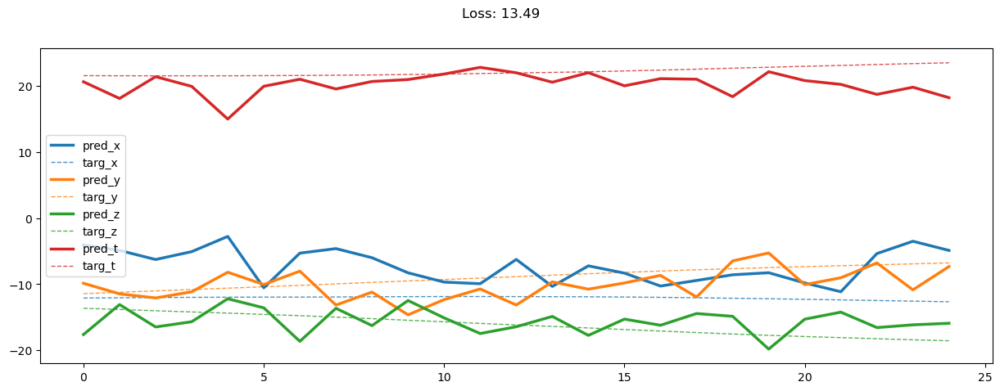

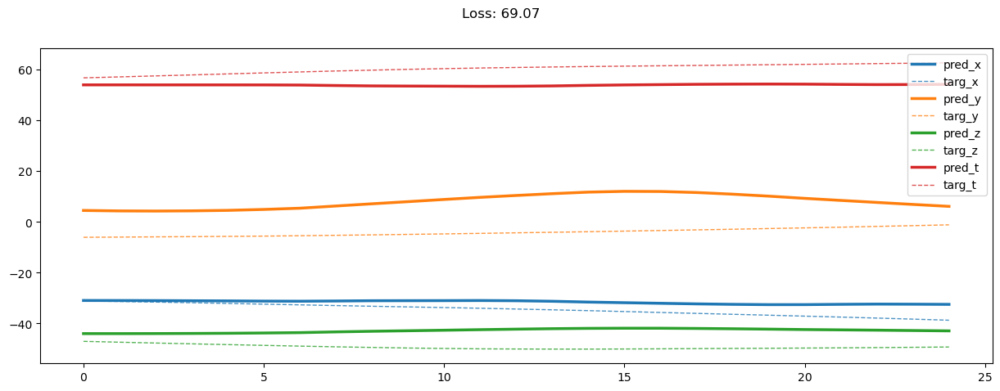

04600: train loss:  49.021, imu loss:  0.662, mag loss:  10.761, div loss:  21.377, slim:  4.142, tlim:  2.260
       valid loss:  118.387, imu loss:  0.477, mag loss:  38.029, div loss:  34.027, slim:  4.292, tlim:  3.786
04620: train loss:  48.935, imu loss:  0.663, mag loss:  10.703, div loss:  21.397, slim:  4.149, tlim:  2.263
       valid loss:  119.831, imu loss:  0.477, mag loss:  38.578, div loss:  34.311, slim:  4.348, tlim:  3.808
04640: train loss:  48.859, imu loss:  0.662, mag loss:  10.679, div loss:  21.376, slim:  4.162, tlim:  2.255
       valid loss:  118.739, imu loss:  0.477, mag loss:  38.146, div loss:  34.185, slim:  4.281, tlim:  3.763
04660: train loss:  48.654, imu loss:  0.661, mag loss:  10.642, div loss:  21.249, slim:  4.145, tlim:  2.259
       valid loss:  120.168, imu loss:  0.478, mag loss:  38.686, div loss:  34.501, slim:  4.346, tlim:  3.764
04680: train loss:  48.474, imu loss:  0.663, mag loss:  10.585, div loss:  21.188, slim:  4.141, tlim:  2.2

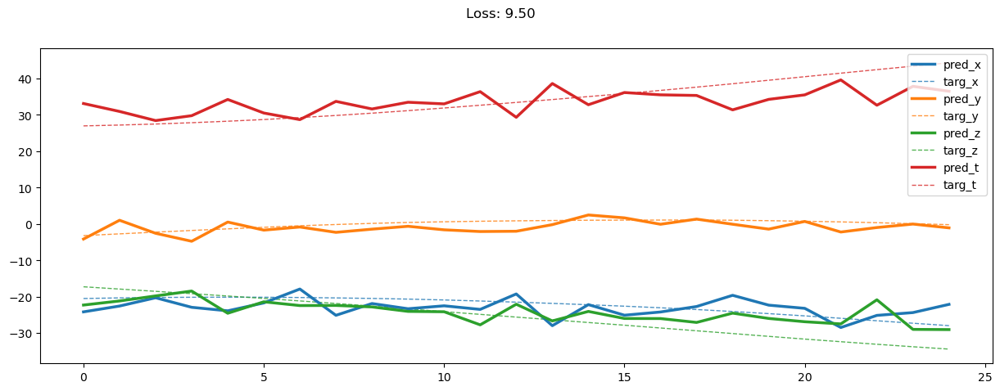

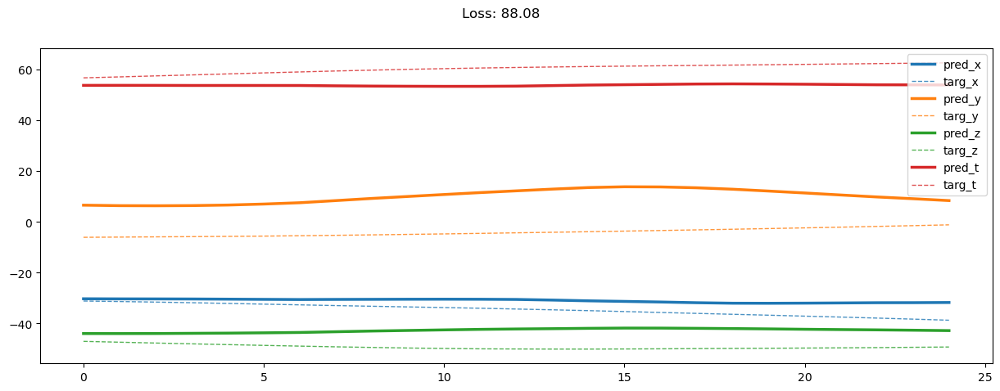

04800: train loss:  48.164, imu loss:  0.660, mag loss:  10.525, div loss:  21.012, slim:  4.150, tlim:  2.245
       valid loss:  120.375, imu loss:  0.478, mag loss:  38.755, div loss:  34.507, slim:  4.369, tlim:  3.797
04820: train loss:  47.800, imu loss:  0.662, mag loss:  10.479, div loss:  20.770, slim:  4.135, tlim:  2.229
       valid loss:  119.393, imu loss:  0.478, mag loss:  38.296, div loss:  34.470, slim:  4.336, tlim:  3.789
04840: train loss:  47.778, imu loss:  0.660, mag loss:  10.440, div loss:  20.806, slim:  4.148, tlim:  2.239
       valid loss:  119.042, imu loss:  0.478, mag loss:  38.155, div loss:  34.421, slim:  4.334, tlim:  3.778
04860: train loss:  47.661, imu loss:  0.661, mag loss:  10.398, div loss:  20.784, slim:  4.147, tlim:  2.231
       valid loss:  120.138, imu loss:  0.478, mag loss:  38.742, div loss:  34.333, slim:  4.328, tlim:  3.787
04880: train loss:  47.534, imu loss:  0.662, mag loss:  10.356, div loss:  20.737, slim:  4.158, tlim:  2.2

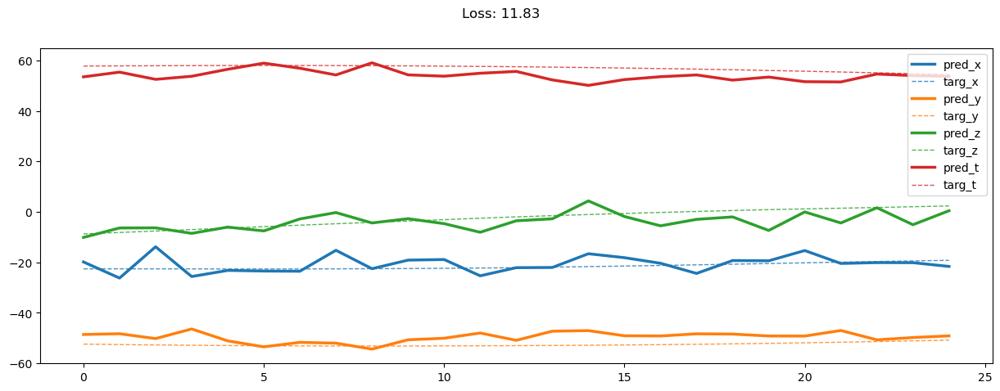

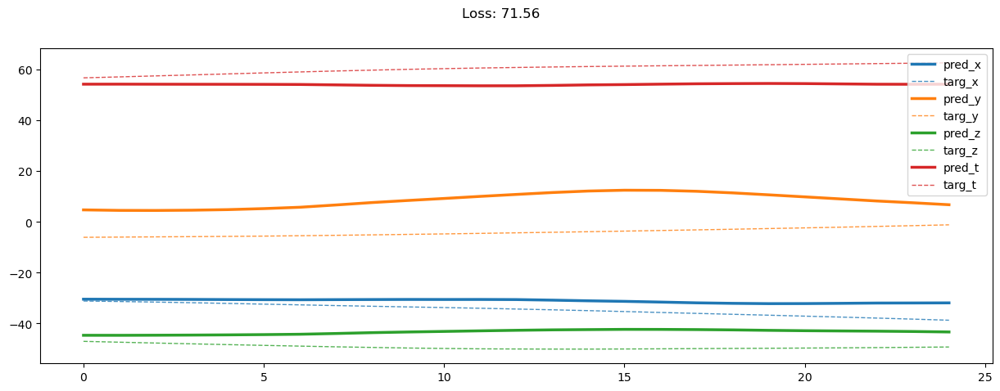

05000: train loss:  47.176, imu loss:  0.662, mag loss:  10.282, div loss:  20.560, slim:  4.156, tlim:  2.208
       valid loss:  119.908, imu loss:  0.478, mag loss:  38.611, div loss:  34.348, slim:  4.308, tlim:  3.804
05020: train loss:  46.805, imu loss:  0.661, mag loss:  10.188, div loss:  20.392, slim:  4.135, tlim:  2.205
       valid loss:  118.852, imu loss:  0.478, mag loss:  38.111, div loss:  34.366, slim:  4.326, tlim:  3.748
05040: train loss:  46.609, imu loss:  0.661, mag loss:  10.142, div loss:  20.283, slim:  4.148, tlim:  2.205
       valid loss:  120.345, imu loss:  0.478, mag loss:  38.775, div loss:  34.436, slim:  4.354, tlim:  3.802
05060: train loss:  46.597, imu loss:  0.661, mag loss:  10.174, div loss:  20.219, slim:  4.156, tlim:  2.193
       valid loss:  119.359, imu loss:  0.478, mag loss:  38.270, div loss:  34.514, slim:  4.317, tlim:  3.780
05080: train loss:  46.543, imu loss:  0.662, mag loss:  10.125, div loss:  20.241, slim:  4.167, tlim:  2.2

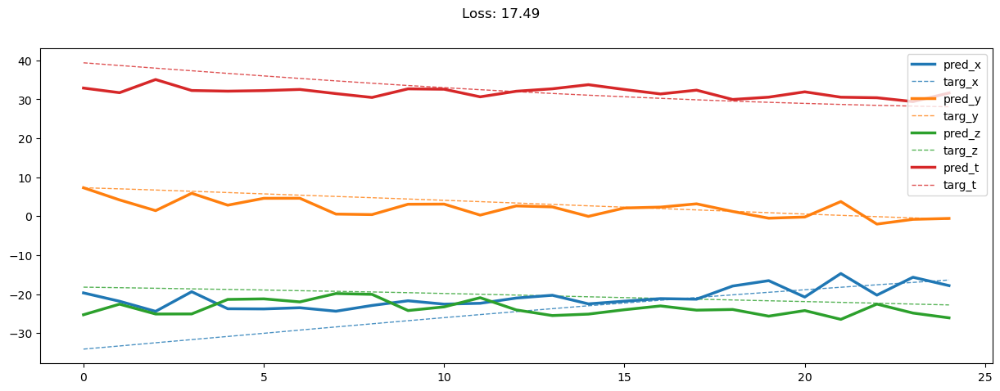

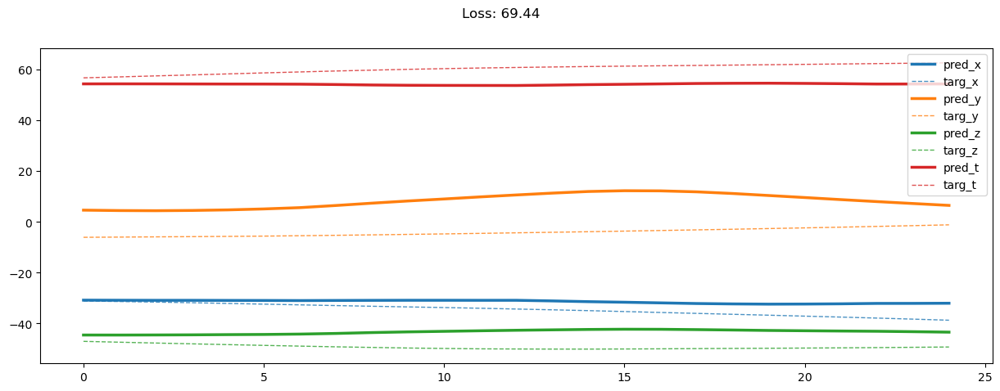

05200: train loss:  45.691, imu loss:  0.661, mag loss:  9.940, div loss:  19.798, slim:  4.150, tlim:  2.184
       valid loss:  119.538, imu loss:  0.478, mag loss:  38.508, div loss:  34.284, slim:  4.279, tlim:  3.747
05220: train loss:  45.803, imu loss:  0.662, mag loss:  9.954, div loss:  19.891, slim:  4.159, tlim:  2.175
       valid loss:  119.138, imu loss:  0.478, mag loss:  38.292, div loss:  34.330, slim:  4.280, tlim:  3.737
05240: train loss:  45.817, imu loss:  0.662, mag loss:  9.938, div loss:  19.946, slim:  4.134, tlim:  2.177
       valid loss:  118.338, imu loss:  0.478, mag loss:  37.969, div loss:  34.095, slim:  4.324, tlim:  3.777
05260: train loss:  45.492, imu loss:  0.662, mag loss:  9.882, div loss:  19.723, slim:  4.162, tlim:  2.175
       valid loss:  121.516, imu loss:  0.478, mag loss:  39.335, div loss:  34.516, slim:  4.336, tlim:  3.789
05280: train loss:  45.801, imu loss:  0.663, mag loss:  9.927, div loss:  19.949, slim:  4.155, tlim:  2.172
  

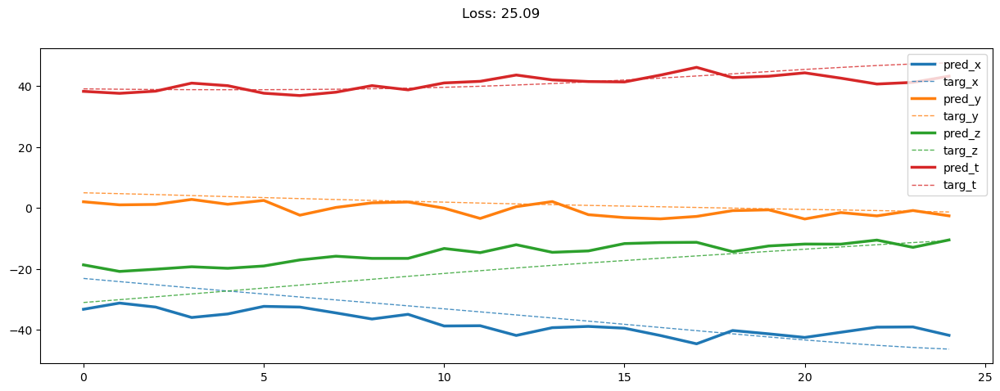

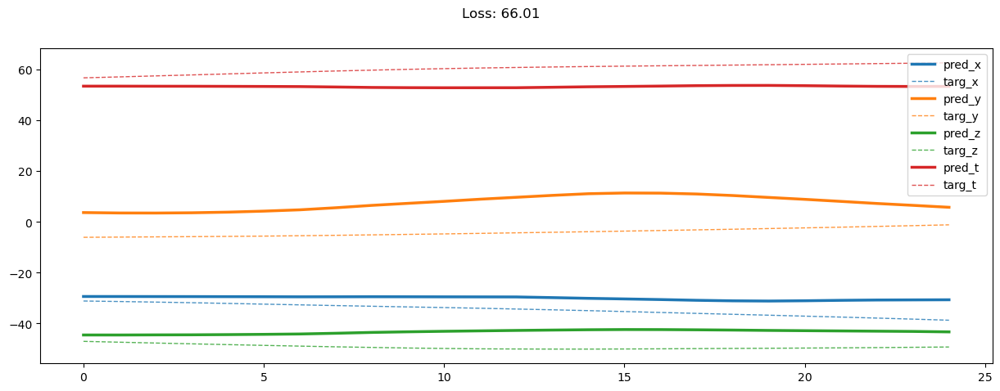

05400: train loss:  45.079, imu loss:  0.660, mag loss:  9.778, div loss:  19.557, slim:  4.148, tlim:  2.154
       valid loss:  119.930, imu loss:  0.478, mag loss:  38.650, div loss:  34.326, slim:  4.294, tlim:  3.785
05420: train loss:  45.025, imu loss:  0.663, mag loss:  9.767, div loss:  19.517, slim:  4.159, tlim:  2.154
       valid loss:  120.503, imu loss:  0.478, mag loss:  38.863, div loss:  34.542, slim:  4.288, tlim:  3.742
05440: train loss:  44.862, imu loss:  0.661, mag loss:  9.752, div loss:  19.387, slim:  4.169, tlim:  2.150
       valid loss:  119.399, imu loss:  0.478, mag loss:  38.445, div loss:  34.185, slim:  4.306, tlim:  3.795
05460: train loss:  44.774, imu loss:  0.659, mag loss:  9.708, div loss:  19.381, slim:  4.165, tlim:  2.157
       valid loss:  119.779, imu loss:  0.478, mag loss:  38.634, div loss:  34.176, slim:  4.322, tlim:  3.797
05480: train loss:  44.414, imu loss:  0.659, mag loss:  9.648, div loss:  19.161, slim:  4.167, tlim:  2.143
  

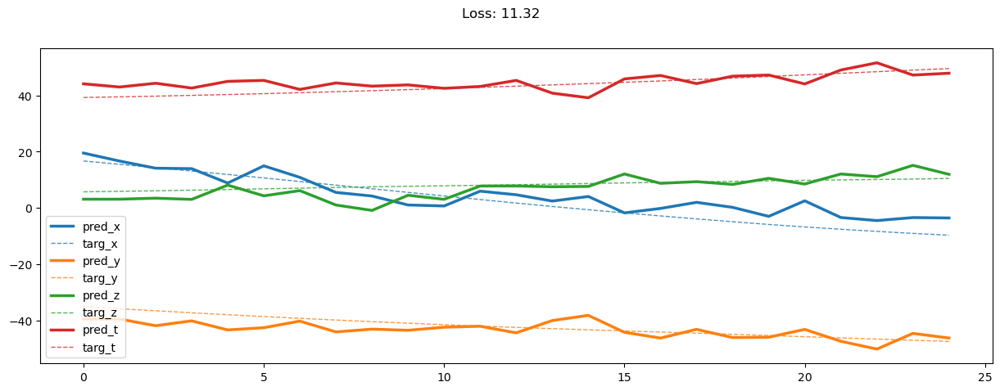

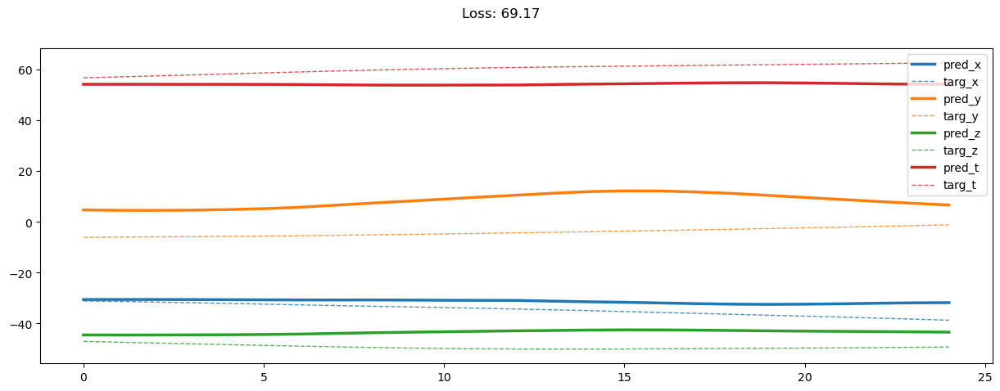

05600: train loss:  44.193, imu loss:  0.661, mag loss:  9.547, div loss:  19.157, slim:  4.150, tlim:  2.137
       valid loss:  119.823, imu loss:  0.478, mag loss:  38.604, div loss:  34.356, slim:  4.275, tlim:  3.762
05620: train loss:  44.119, imu loss:  0.659, mag loss:  9.558, div loss:  19.078, slim:  4.132, tlim:  2.132
       valid loss:  119.302, imu loss:  0.478, mag loss:  38.311, div loss:  34.372, slim:  4.305, tlim:  3.786
05640: train loss:  44.145, imu loss:  0.663, mag loss:  9.578, div loss:  19.042, slim:  4.166, tlim:  2.134
       valid loss:  120.296, imu loss:  0.478, mag loss:  38.709, div loss:  34.557, slim:  4.317, tlim:  3.789
05660: train loss:  43.856, imu loss:  0.661, mag loss:  9.508, div loss:  18.921, slim:  4.146, tlim:  2.123
       valid loss:  120.129, imu loss:  0.478, mag loss:  38.644, div loss:  34.503, slim:  4.344, tlim:  3.792
05680: train loss:  44.183, imu loss:  0.661, mag loss:  9.550, div loss:  19.152, slim:  4.141, tlim:  2.133
  

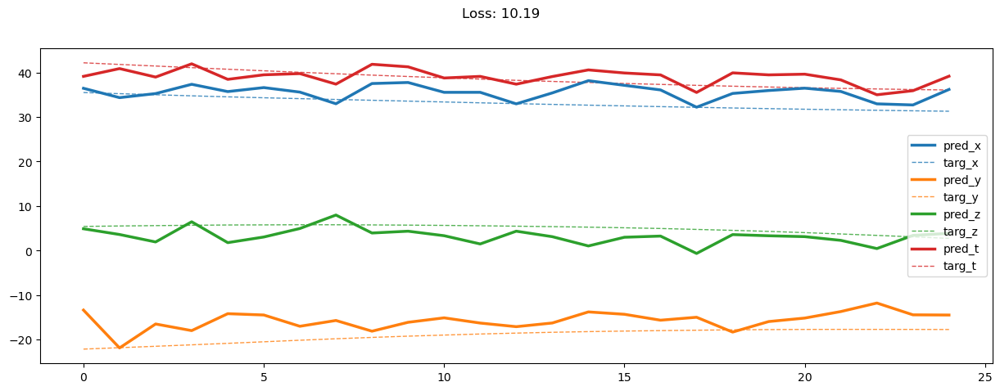

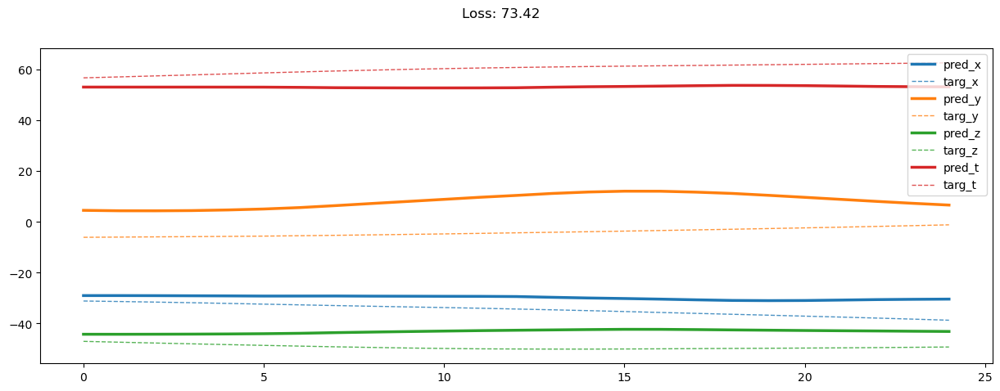

05800: train loss:  43.427, imu loss:  0.660, mag loss:  9.400, div loss:  18.719, slim:  4.151, tlim:  2.116
       valid loss:  119.509, imu loss:  0.478, mag loss:  38.523, div loss:  34.221, slim:  4.294, tlim:  3.745
05820: train loss:  43.133, imu loss:  0.659, mag loss:  9.293, div loss:  18.633, slim:  4.171, tlim:  2.113
       valid loss:  118.847, imu loss:  0.478, mag loss:  38.208, div loss:  34.141, slim:  4.304, tlim:  3.773
05840: train loss:  43.071, imu loss:  0.659, mag loss:  9.309, div loss:  18.555, slim:  4.155, tlim:  2.107
       valid loss:  119.809, imu loss:  0.478, mag loss:  38.646, div loss:  34.306, slim:  4.243, tlim:  3.741
05860: train loss:  42.713, imu loss:  0.659, mag loss:  9.221, div loss:  18.381, slim:  4.160, tlim:  2.101
       valid loss:  120.022, imu loss:  0.478, mag loss:  38.720, div loss:  34.290, slim:  4.262, tlim:  3.788
05880: train loss:  42.924, imu loss:  0.660, mag loss:  9.277, div loss:  18.475, slim:  4.163, tlim:  2.101
  

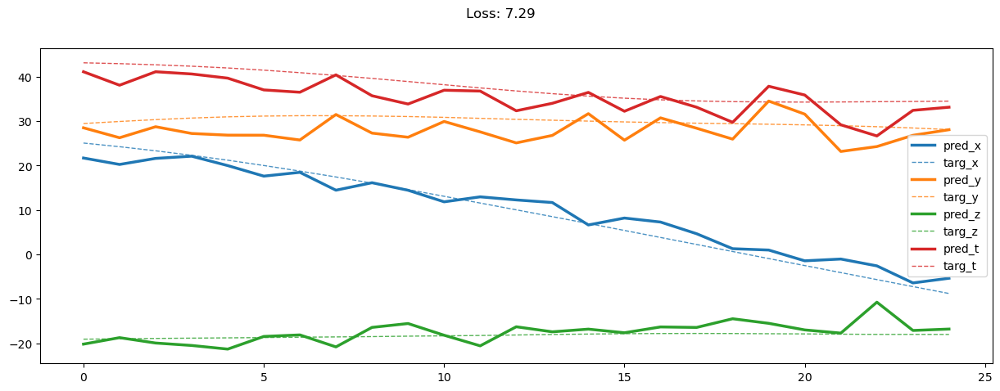

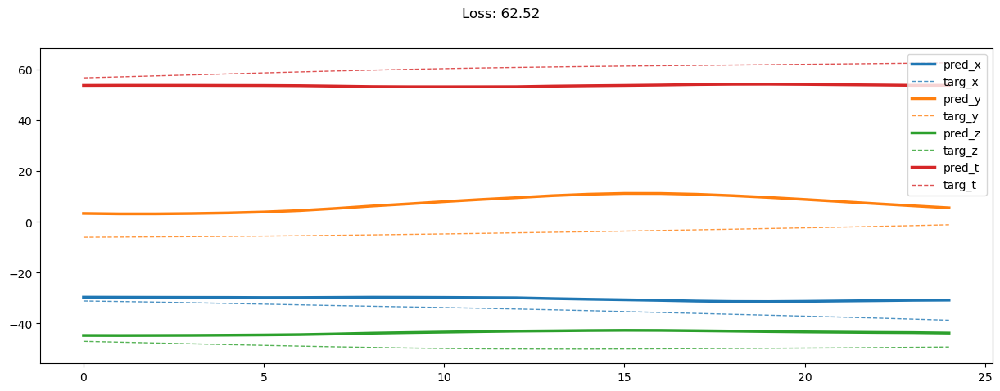

06000: train loss:  42.318, imu loss:  0.660, mag loss:  9.130, div loss:  18.188, slim:  4.161, tlim:  2.087
       valid loss:  119.763, imu loss:  0.478, mag loss:  38.671, div loss:  34.052, slim:  4.345, tlim:  3.813
06020: train loss:  42.409, imu loss:  0.661, mag loss:  9.128, div loss:  18.282, slim:  4.162, tlim:  2.086
       valid loss:  119.501, imu loss:  0.478, mag loss:  38.519, div loss:  34.146, slim:  4.320, tlim:  3.786
06040: train loss:  42.200, imu loss:  0.660, mag loss:  9.085, div loss:  18.180, slim:  4.144, tlim:  2.079
       valid loss:  118.839, imu loss:  0.478, mag loss:  38.242, div loss:  34.052, slim:  4.323, tlim:  3.775
06060: train loss:  42.336, imu loss:  0.660, mag loss:  9.111, div loss:  18.252, slim:  4.156, tlim:  2.082
       valid loss:  120.653, imu loss:  0.478, mag loss:  38.942, div loss:  34.456, slim:  4.331, tlim:  3.780
06080: train loss:  42.550, imu loss:  0.658, mag loss:  9.166, div loss:  18.337, slim:  4.173, tlim:  2.091
  

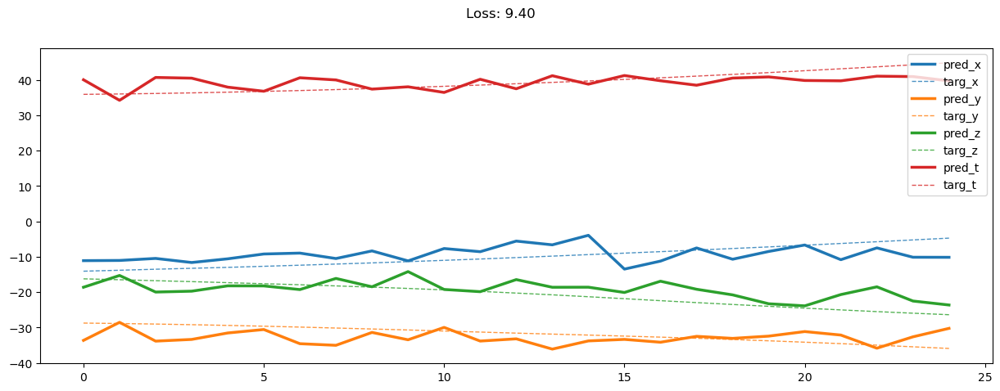

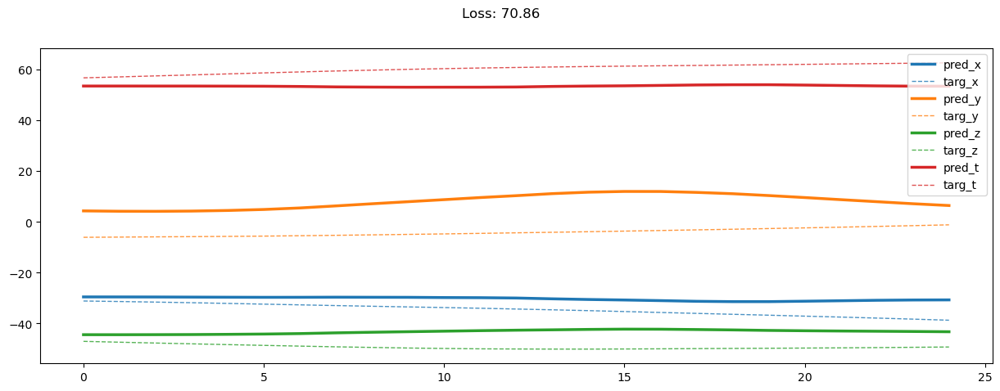

06200: train loss:  41.639, imu loss:  0.660, mag loss:  8.950, div loss:  17.895, slim:  4.154, tlim:  2.072
       valid loss:  119.685, imu loss:  0.478, mag loss:  38.699, div loss:  33.976, slim:  4.300, tlim:  3.789
06220: train loss:  41.564, imu loss:  0.659, mag loss:  8.933, div loss:  17.851, slim:  4.168, tlim:  2.069
       valid loss:  120.557, imu loss:  0.478, mag loss:  38.955, div loss:  34.337, slim:  4.307, tlim:  3.785
06240: train loss:  41.656, imu loss:  0.660, mag loss:  8.949, div loss:  17.908, slim:  4.156, tlim:  2.075
       valid loss:  120.020, imu loss:  0.479, mag loss:  38.739, div loss:  34.192, slim:  4.339, tlim:  3.801
06260: train loss:  41.561, imu loss:  0.659, mag loss:  8.917, div loss:  17.897, slim:  4.134, tlim:  2.069
       valid loss:  118.999, imu loss:  0.478, mag loss:  38.291, div loss:  34.111, slim:  4.339, tlim:  3.773
06280: train loss:  41.776, imu loss:  0.659, mag loss:  8.982, div loss:  17.990, slim:  4.140, tlim:  2.061
  

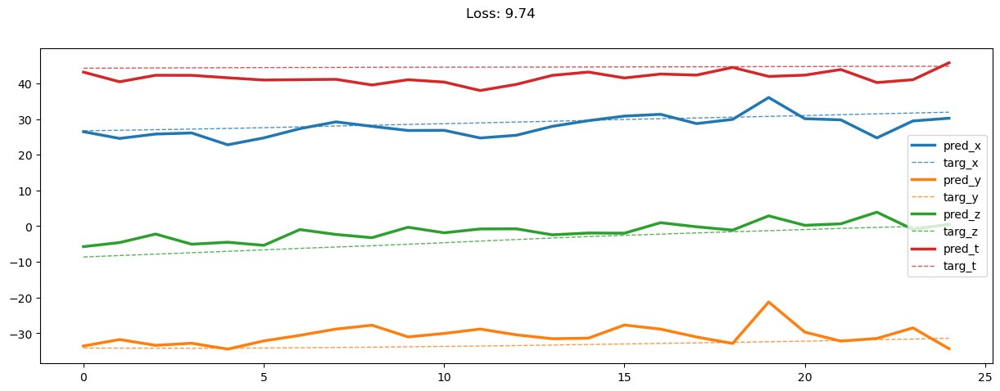

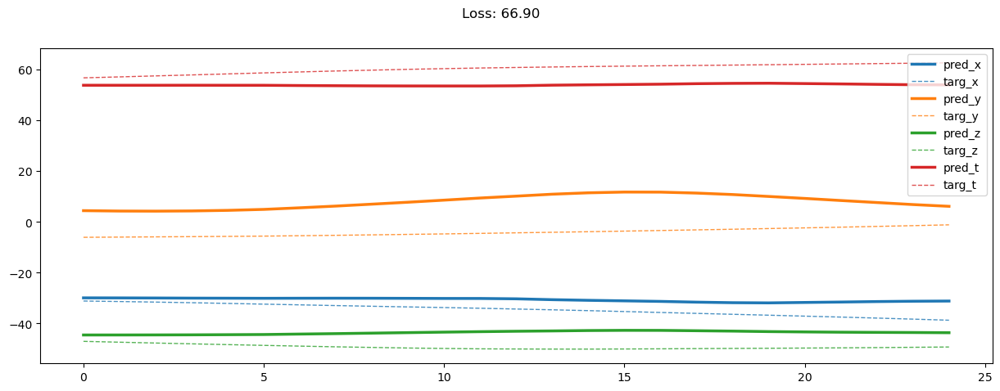

06400: train loss:  41.308, imu loss:  0.659, mag loss:  8.870, div loss:  17.754, slim:  4.150, tlim:  2.054
       valid loss:  119.392, imu loss:  0.478, mag loss:  38.542, div loss:  34.092, slim:  4.281, tlim:  3.731
06420: train loss:  40.780, imu loss:  0.660, mag loss:  8.763, div loss:  17.454, slim:  4.147, tlim:  2.045
       valid loss:  119.272, imu loss:  0.478, mag loss:  38.393, div loss:  34.184, slim:  4.304, tlim:  3.781
06440: train loss:  40.758, imu loss:  0.658, mag loss:  8.739, div loss:  17.483, slim:  4.133, tlim:  2.048
       valid loss:  119.782, imu loss:  0.478, mag loss:  38.738, div loss:  34.006, slim:  4.343, tlim:  3.767
06460: train loss:  40.804, imu loss:  0.658, mag loss:  8.760, div loss:  17.484, slim:  4.160, tlim:  2.041
       valid loss:  119.749, imu loss:  0.478, mag loss:  38.615, div loss:  34.214, slim:  4.318, tlim:  3.779
06480: train loss:  40.765, imu loss:  0.658, mag loss:  8.758, div loss:  17.450, slim:  4.137, tlim:  2.049
  

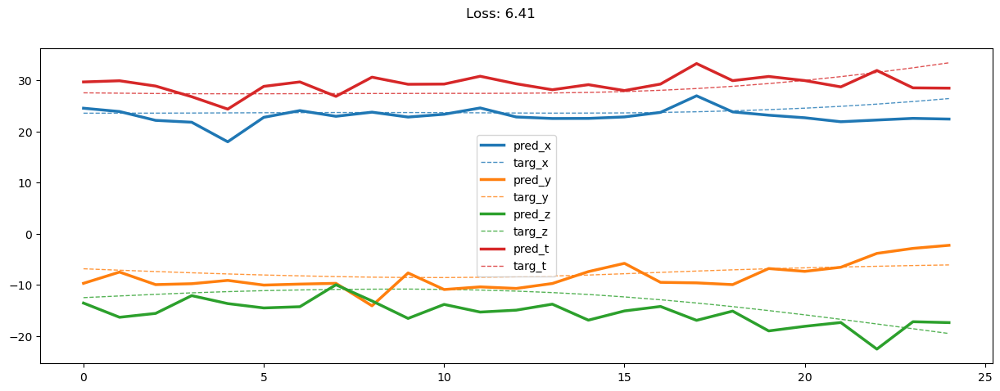

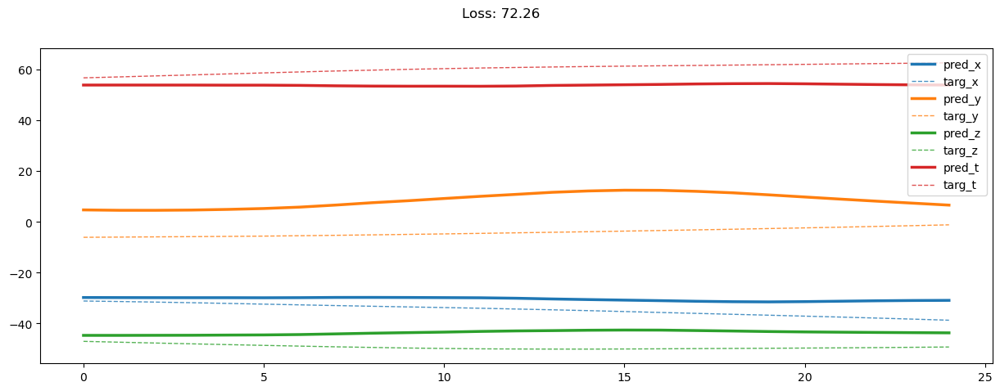

06600: train loss:  40.565, imu loss:  0.659, mag loss:  8.681, div loss:  17.413, slim:  4.149, tlim:  2.037
       valid loss:  120.247, imu loss:  0.478, mag loss:  38.899, div loss:  34.208, slim:  4.253, tlim:  3.758
06620: train loss:  40.388, imu loss:  0.659, mag loss:  8.631, div loss:  17.354, slim:  4.148, tlim:  2.026
       valid loss:  119.786, imu loss:  0.478, mag loss:  38.715, div loss:  34.039, slim:  4.309, tlim:  3.789
06640: train loss:  40.073, imu loss:  0.661, mag loss:  8.564, div loss:  17.180, slim:  4.162, tlim:  2.015
       valid loss:  119.443, imu loss:  0.478, mag loss:  38.493, div loss:  34.165, slim:  4.303, tlim:  3.774
06660: train loss:  40.044, imu loss:  0.658, mag loss:  8.579, div loss:  17.123, slim:  4.162, tlim:  2.015
       valid loss:  119.395, imu loss:  0.478, mag loss:  38.578, div loss:  33.952, slim:  4.297, tlim:  3.773
06680: train loss:  39.936, imu loss:  0.660, mag loss:  8.552, div loss:  17.053, slim:  4.162, tlim:  2.024
  

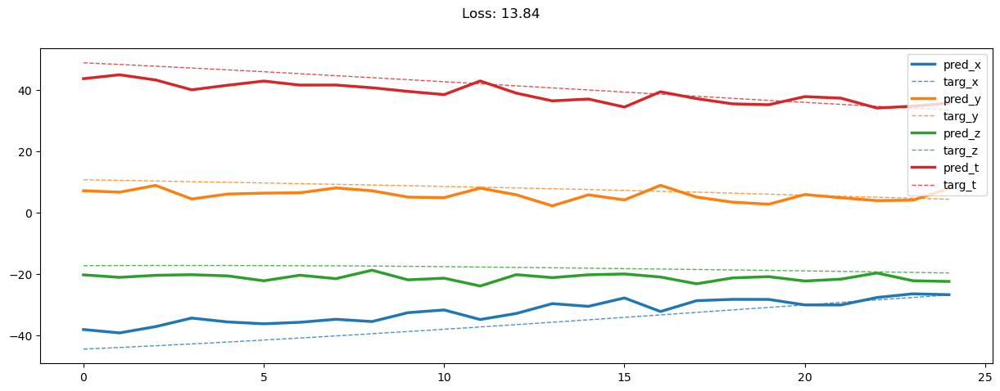

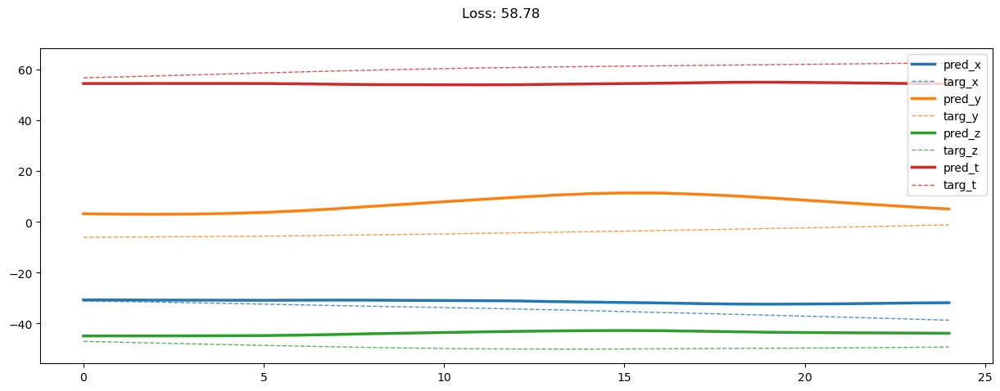

06800: train loss:  39.534, imu loss:  0.660, mag loss:  8.466, div loss:  16.846, slim:  4.174, tlim:  2.006
       valid loss:  118.765, imu loss:  0.478, mag loss:  38.310, div loss:  33.951, slim:  4.231, tlim:  3.733
06820: train loss:  39.776, imu loss:  0.658, mag loss:  8.506, div loss:  17.003, slim:  4.149, tlim:  2.019
       valid loss:  119.814, imu loss:  0.478, mag loss:  38.704, div loss:  34.187, slim:  4.247, tlim:  3.744
06840: train loss:  39.522, imu loss:  0.661, mag loss:  8.445, div loss:  16.877, slim:  4.153, tlim:  2.013
       valid loss:  119.429, imu loss:  0.478, mag loss:  38.580, div loss:  33.935, slim:  4.314, tlim:  3.800
06860: train loss:  39.497, imu loss:  0.658, mag loss:  8.426, div loss:  16.912, slim:  4.149, tlim:  2.001
       valid loss:  119.734, imu loss:  0.478, mag loss:  38.680, div loss:  34.149, slim:  4.258, tlim:  3.745
06880: train loss:  39.556, imu loss:  0.660, mag loss:  8.463, div loss:  16.877, slim:  4.174, tlim:  2.004
  

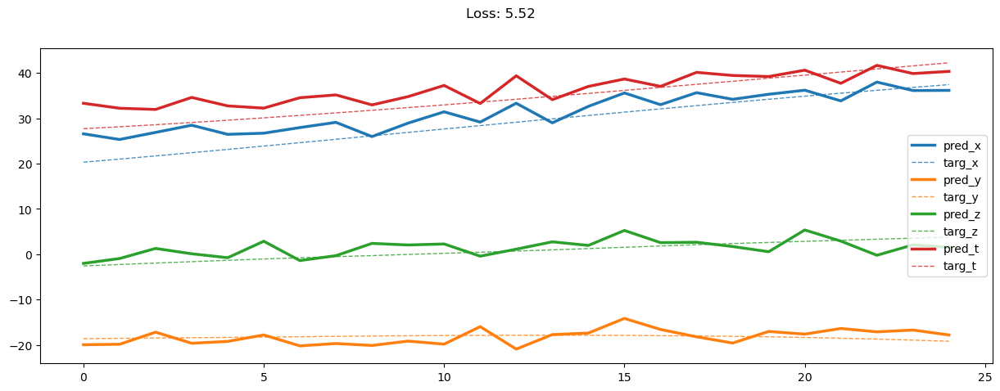

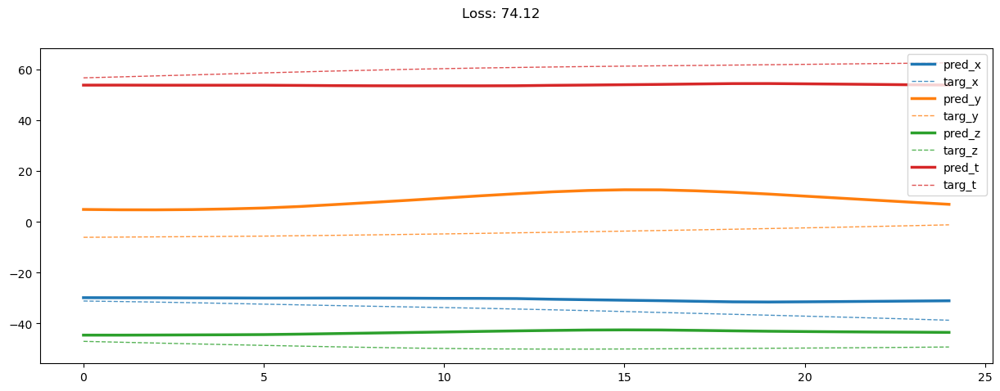

07000: train loss:  39.255, imu loss:  0.657, mag loss:  8.374, div loss:  16.775, slim:  4.167, tlim:  1.993
       valid loss:  119.494, imu loss:  0.478, mag loss:  38.656, div loss:  33.876, slim:  4.300, tlim:  3.785
07020: train loss:  38.882, imu loss:  0.661, mag loss:  8.330, div loss:  16.502, slim:  4.160, tlim:  1.986
       valid loss:  119.418, imu loss:  0.478, mag loss:  38.616, div loss:  33.922, slim:  4.264, tlim:  3.768
07040: train loss:  38.871, imu loss:  0.660, mag loss:  8.295, div loss:  16.565, slim:  4.152, tlim:  1.987
       valid loss:  119.458, imu loss:  0.478, mag loss:  38.618, div loss:  33.953, slim:  4.280, tlim:  3.768
07060: train loss:  38.774, imu loss:  0.659, mag loss:  8.282, div loss:  16.505, slim:  4.136, tlim:  1.986
       valid loss:  120.342, imu loss:  0.478, mag loss:  38.966, div loss:  34.114, slim:  4.321, tlim:  3.772
07080: train loss:  38.949, imu loss:  0.658, mag loss:  8.319, div loss:  16.591, slim:  4.150, tlim:  1.991
  

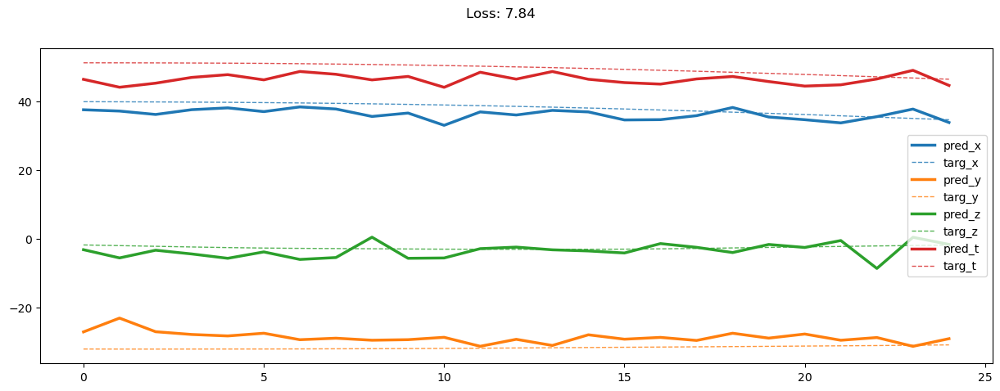

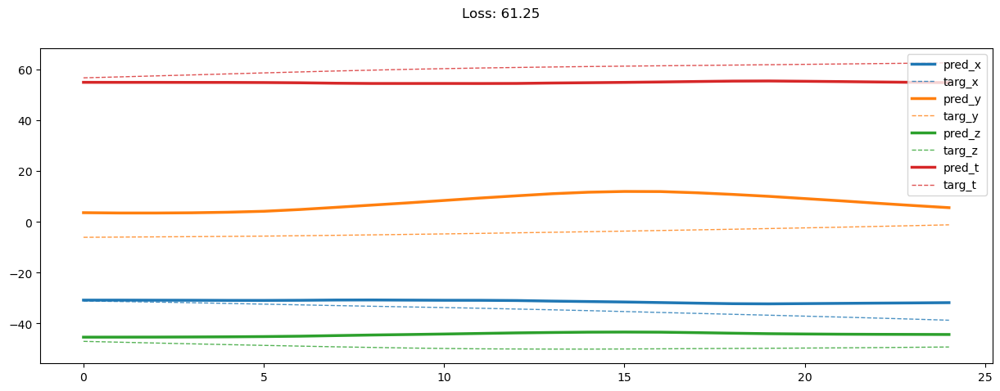

07200: train loss:  38.429, imu loss:  0.660, mag loss:  8.166, div loss:  16.385, slim:  4.166, tlim:  1.980
       valid loss:  119.826, imu loss:  0.478, mag loss:  38.695, div loss:  34.203, slim:  4.262, tlim:  3.749
07220: train loss:  38.404, imu loss:  0.658, mag loss:  8.180, div loss:  16.354, slim:  4.149, tlim:  1.971
       valid loss:  119.769, imu loss:  0.478, mag loss:  38.650, div loss:  34.231, slim:  4.281, tlim:  3.746
07240: train loss:  38.391, imu loss:  0.659, mag loss:  8.178, div loss:  16.338, slim:  4.142, tlim:  1.979
       valid loss:  117.830, imu loss:  0.478, mag loss:  37.894, div loss:  33.806, slim:  4.271, tlim:  3.749
07260: train loss:  38.403, imu loss:  0.659, mag loss:  8.170, div loss:  16.365, slim:  4.159, tlim:  1.973
       valid loss:  119.923, imu loss:  0.478, mag loss:  38.746, div loss:  34.181, slim:  4.284, tlim:  3.753
07280: train loss:  38.199, imu loss:  0.658, mag loss:  8.128, div loss:  16.266, slim:  4.154, tlim:  1.961
  

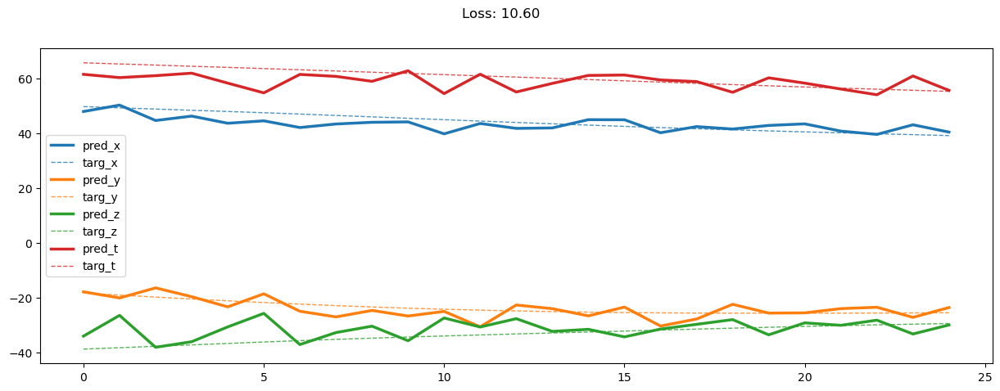

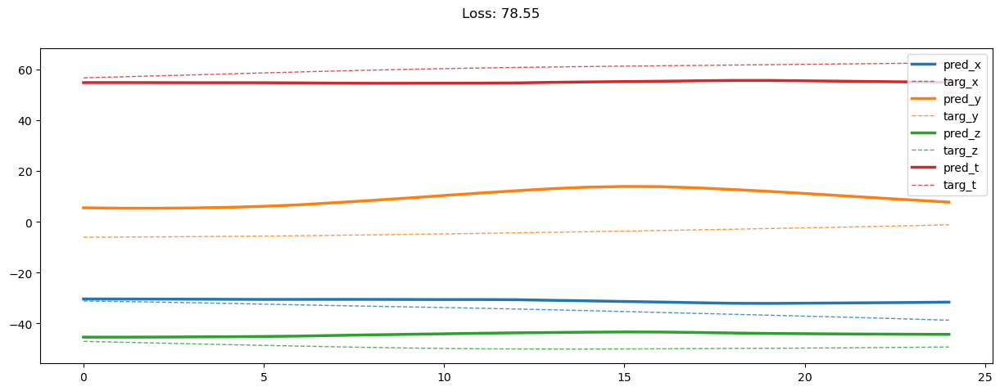

07400: train loss:  37.986, imu loss:  0.660, mag loss:  8.071, div loss:  16.167, slim:  4.145, tlim:  1.964
       valid loss:  119.685, imu loss:  0.478, mag loss:  38.761, div loss:  33.935, slim:  4.269, tlim:  3.743
07420: train loss:  37.908, imu loss:  0.658, mag loss:  8.069, div loss:  16.093, slim:  4.167, tlim:  1.957
       valid loss:  118.870, imu loss:  0.478, mag loss:  38.321, div loss:  33.969, slim:  4.287, tlim:  3.758
07440: train loss:  37.896, imu loss:  0.661, mag loss:  8.038, div loss:  16.130, slim:  4.176, tlim:  1.960
       valid loss:  120.420, imu loss:  0.478, mag loss:  38.999, div loss:  34.149, slim:  4.275, tlim:  3.771
07460: train loss:  37.521, imu loss:  0.658, mag loss:  7.990, div loss:  15.872, slim:  4.158, tlim:  1.956
       valid loss:  119.198, imu loss:  0.478, mag loss:  38.534, div loss:  33.796, slim:  4.338, tlim:  3.792
07480: train loss:  37.450, imu loss:  0.658, mag loss:  7.952, div loss:  15.895, slim:  4.156, tlim:  1.943
  

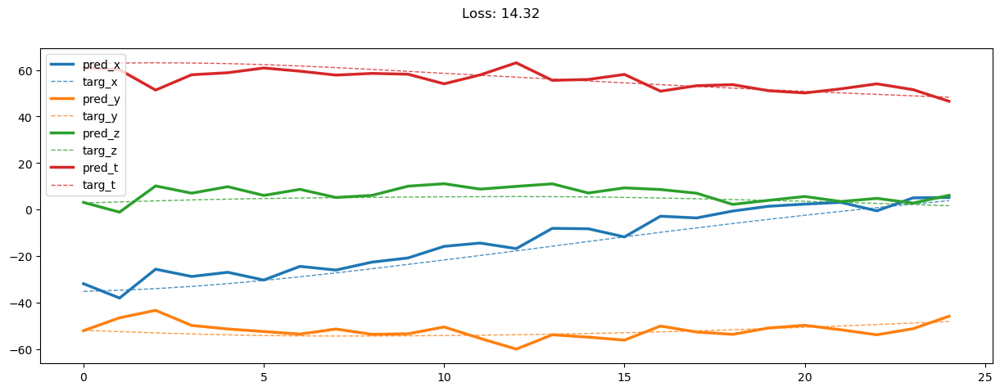

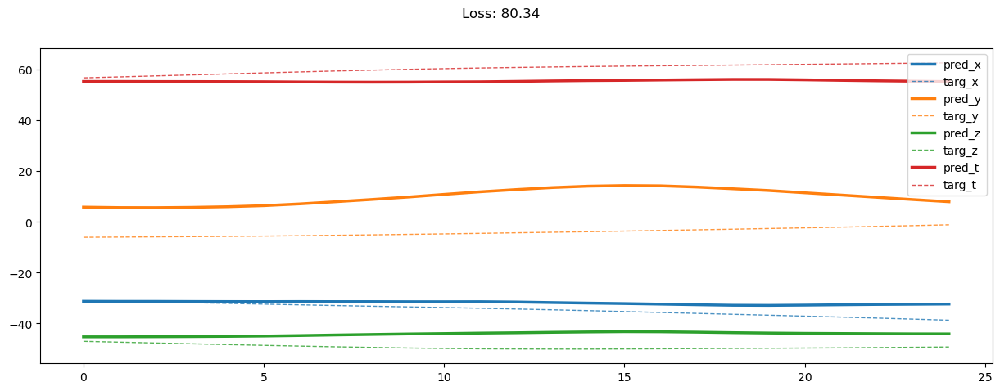

07600: train loss:  37.137, imu loss:  0.662, mag loss:  7.866, div loss:  15.759, slim:  4.161, tlim:  1.937
       valid loss:  120.353, imu loss:  0.478, mag loss:  39.080, div loss:  33.952, slim:  4.292, tlim:  3.744
07620: train loss:  37.304, imu loss:  0.659, mag loss:  7.913, div loss:  15.818, slim:  4.163, tlim:  1.947
       valid loss:  119.006, imu loss:  0.478, mag loss:  38.450, div loss:  33.844, slim:  4.297, tlim:  3.756
07640: train loss:  37.269, imu loss:  0.659, mag loss:  7.917, div loss:  15.782, slim:  4.153, tlim:  1.946
       valid loss:  118.870, imu loss:  0.478, mag loss:  38.445, div loss:  33.791, slim:  4.251, tlim:  3.724
07660: train loss:  37.251, imu loss:  0.658, mag loss:  7.917, div loss:  15.759, slim:  4.166, tlim:  1.944
       valid loss:  119.014, imu loss:  0.478, mag loss:  38.443, div loss:  33.900, slim:  4.272, tlim:  3.742
07680: train loss:  37.012, imu loss:  0.659, mag loss:  7.843, div loss:  15.683, slim:  4.155, tlim:  1.938
  

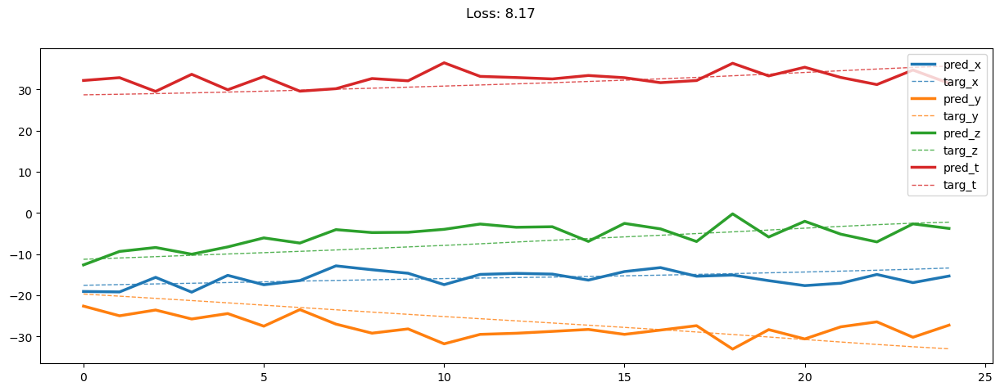

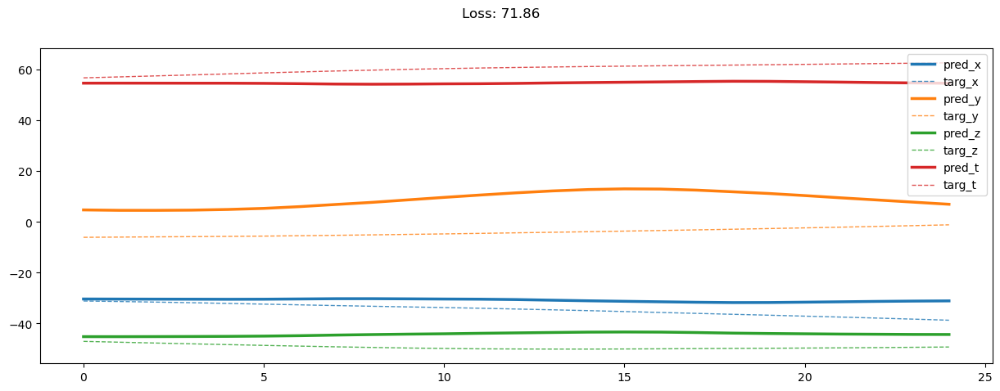

07800: train loss:  36.959, imu loss:  0.658, mag loss:  7.840, div loss:  15.640, slim:  4.169, tlim:  1.931
       valid loss:  119.735, imu loss:  0.478, mag loss:  38.754, div loss:  33.920, slim:  4.285, tlim:  3.791
07820: train loss:  36.845, imu loss:  0.658, mag loss:  7.810, div loss:  15.597, slim:  4.161, tlim:  1.927
       valid loss:  119.350, imu loss:  0.478, mag loss:  38.557, div loss:  34.002, slim:  4.270, tlim:  3.748
07840: train loss:  36.804, imu loss:  0.658, mag loss:  7.791, div loss:  15.589, slim:  4.158, tlim:  1.931
       valid loss:  119.125, imu loss:  0.478, mag loss:  38.484, div loss:  33.811, slim:  4.319, tlim:  3.806
07860: train loss:  36.759, imu loss:  0.659, mag loss:  7.802, div loss:  15.529, slim:  4.167, tlim:  1.923
       valid loss:  119.315, imu loss:  0.478, mag loss:  38.570, div loss:  33.862, slim:  4.313, tlim:  3.785
07880: train loss:  36.655, imu loss:  0.659, mag loss:  7.760, div loss:  15.514, slim:  4.151, tlim:  1.924
  

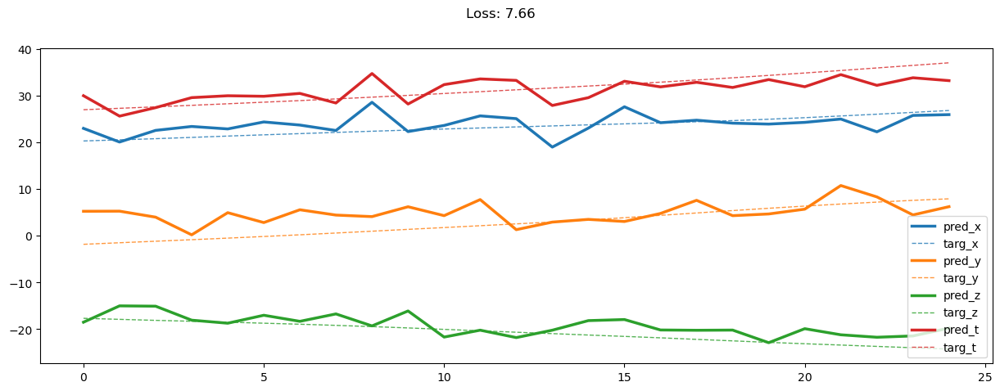

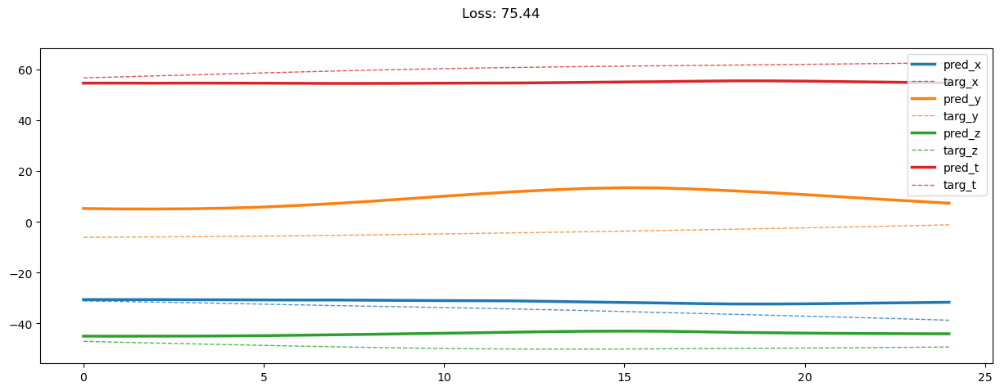

08000: train loss:  36.470, imu loss:  0.659, mag loss:  7.717, div loss:  15.428, slim:  4.162, tlim:  1.912
       valid loss:  119.907, imu loss:  0.478, mag loss:  38.871, div loss:  33.902, slim:  4.297, tlim:  3.758
08020: train loss:  36.336, imu loss:  0.660, mag loss:  7.687, div loss:  15.359, slim:  4.174, tlim:  1.904
       valid loss:  118.568, imu loss:  0.478, mag loss:  38.267, div loss:  33.789, slim:  4.289, tlim:  3.748
08040: train loss:  36.291, imu loss:  0.660, mag loss:  7.689, div loss:  15.299, slim:  4.177, tlim:  1.910
       valid loss:  118.028, imu loss:  0.478, mag loss:  37.949, div loss:  33.829, slim:  4.310, tlim:  3.778
08060: train loss:  36.131, imu loss:  0.659, mag loss:  7.617, div loss:  15.303, slim:  4.167, tlim:  1.901
       valid loss:  118.865, imu loss:  0.478, mag loss:  38.531, div loss:  33.547, slim:  4.295, tlim:  3.753
08080: train loss:  36.187, imu loss:  0.657, mag loss:  7.660, div loss:  15.275, slim:  4.139, tlim:  1.911
  

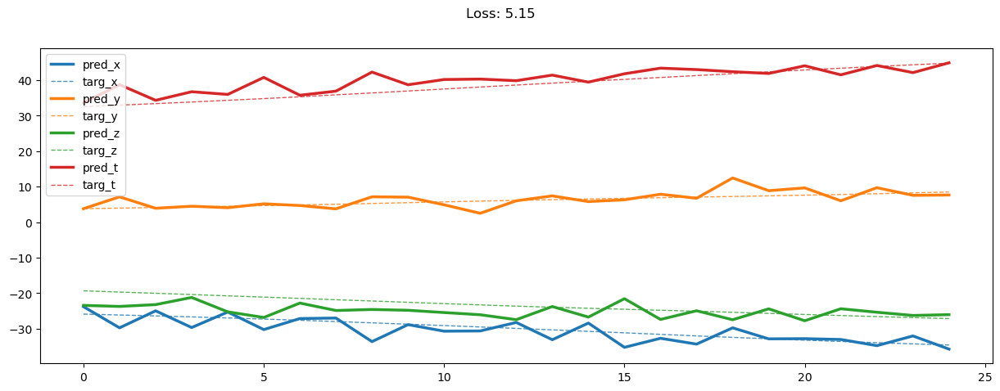

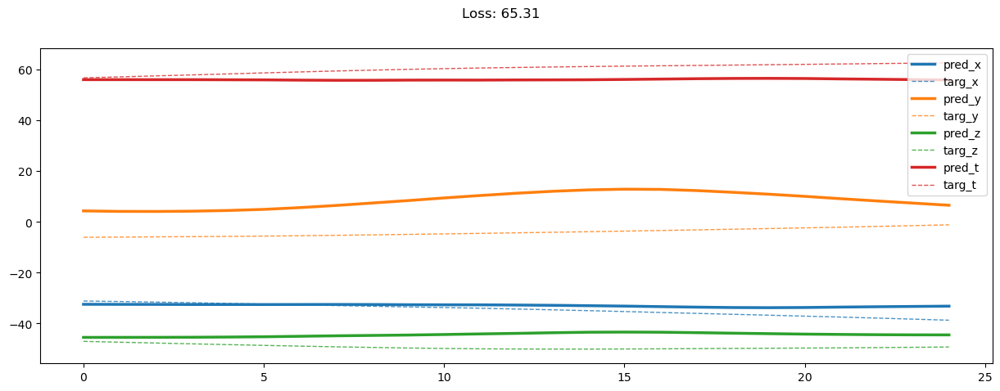

08200: train loss:  35.668, imu loss:  0.658, mag loss:  7.535, div loss:  15.028, slim:  4.148, tlim:  1.892
       valid loss:  118.780, imu loss:  0.478, mag loss:  38.367, div loss:  33.895, slim:  4.234, tlim:  3.703
08220: train loss:  35.805, imu loss:  0.658, mag loss:  7.564, div loss:  15.095, slim:  4.160, tlim:  1.895
       valid loss:  119.259, imu loss:  0.478, mag loss:  38.638, div loss:  33.738, slim:  4.263, tlim:  3.757
08240: train loss:  35.820, imu loss:  0.658, mag loss:  7.554, div loss:  15.128, slim:  4.168, tlim:  1.894
       valid loss:  118.935, imu loss:  0.478, mag loss:  38.400, div loss:  33.854, slim:  4.293, tlim:  3.770
08260: train loss:  35.568, imu loss:  0.658, mag loss:  7.513, div loss:  14.966, slim:  4.157, tlim:  1.893
       valid loss:  118.655, imu loss:  0.479, mag loss:  38.227, div loss:  34.005, slim:  4.231, tlim:  3.736
08280: train loss:  35.721, imu loss:  0.659, mag loss:  7.536, div loss:  15.076, slim:  4.147, tlim:  1.894
  

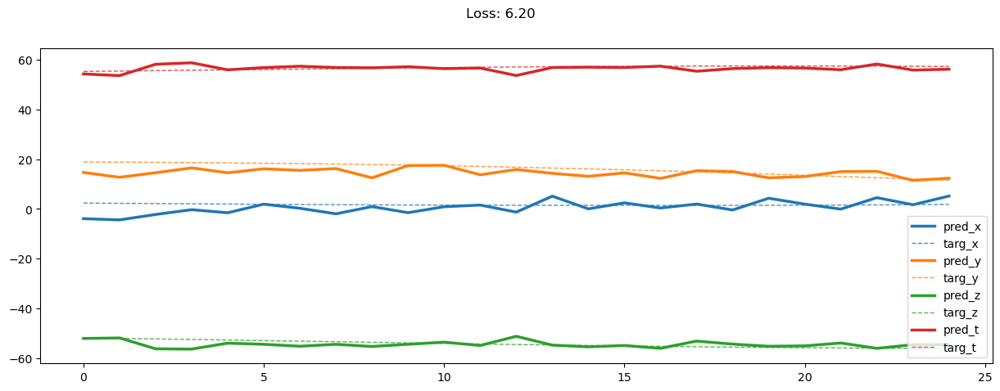

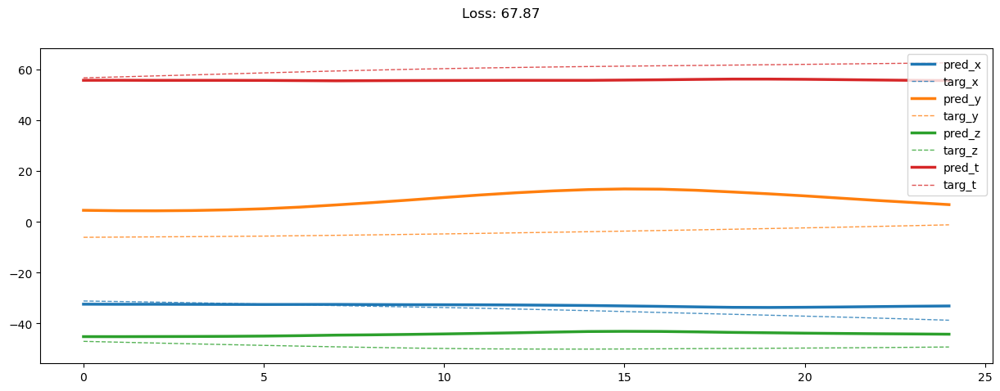

08400: train loss:  35.425, imu loss:  0.657, mag loss:  7.471, div loss:  14.920, slim:  4.153, tlim:  1.886
       valid loss:  119.448, imu loss:  0.479, mag loss:  38.722, div loss:  33.713, slim:  4.326, tlim:  3.767
08420: train loss:  35.269, imu loss:  0.659, mag loss:  7.446, div loss:  14.813, slim:  4.167, tlim:  1.880
       valid loss:  118.281, imu loss:  0.478, mag loss:  38.199, div loss:  33.655, slim:  4.278, tlim:  3.740
08440: train loss:  35.235, imu loss:  0.655, mag loss:  7.414, div loss:  14.857, slim:  4.152, tlim:  1.879
       valid loss:  118.569, imu loss:  0.478, mag loss:  38.405, div loss:  33.562, slim:  4.250, tlim:  3.729
08460: train loss:  35.219, imu loss:  0.658, mag loss:  7.435, div loss:  14.814, slim:  4.144, tlim:  1.870
       valid loss:  119.727, imu loss:  0.479, mag loss:  38.828, div loss:  33.819, slim:  4.266, tlim:  3.761
08480: train loss:  35.363, imu loss:  0.657, mag loss:  7.452, div loss:  14.906, slim:  4.139, tlim:  1.883
  

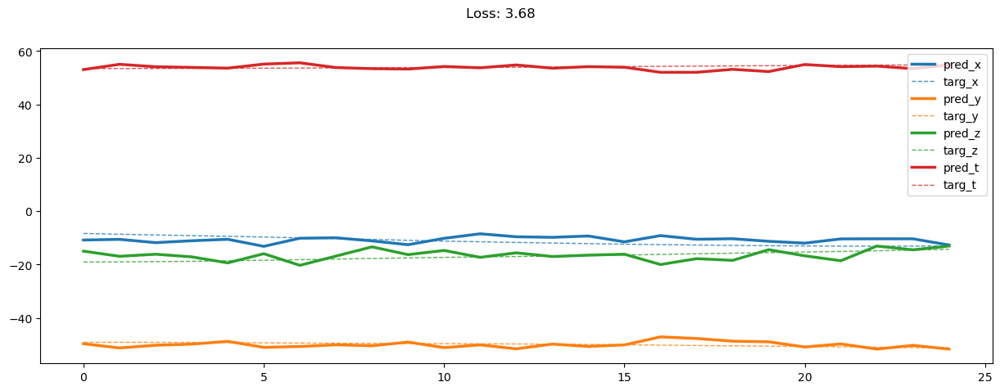

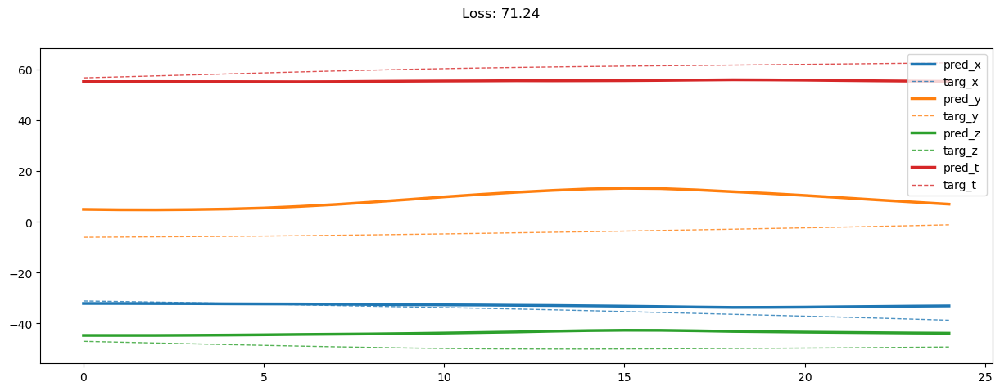

08600: train loss:  35.155, imu loss:  0.658, mag loss:  7.401, div loss:  14.805, slim:  4.154, tlim:  1.876
       valid loss:  119.089, imu loss:  0.479, mag loss:  38.516, div loss:  33.818, slim:  4.274, tlim:  3.749


In [ ]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, slim: {tlim_loss[0]: 2.3f}, tlim: {tlim_loss[1]: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, slim: {vlim_loss[0]: 2.3f}, tlim: {vlim_loss[1]: 2.3f}')

In [38]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 6:9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 6:9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 3) - target_mag.reshape(len(target_mag), -1, 3), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [39]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(8973, 3) (8973,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:     3.40     3.56     2.77     3.24
         pocket loss:     3.44     2.76     2.68     2.96
          swing loss:     2.97     3.26     3.05     3.09
        average loss:     3.27     3.19     2.83     3.10


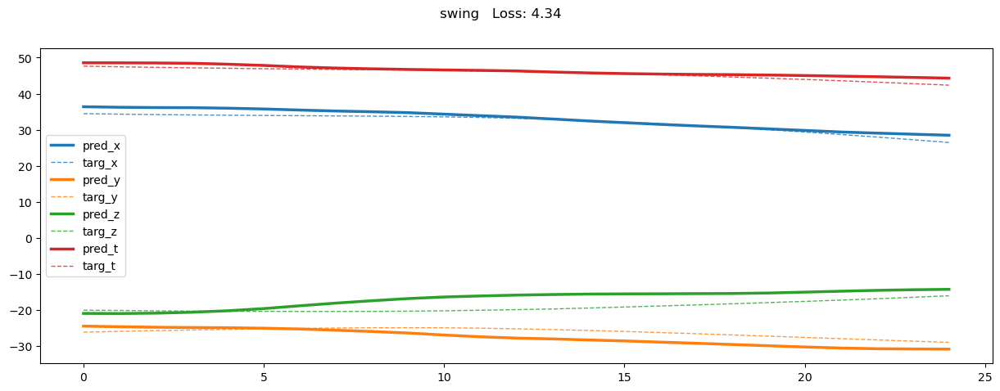

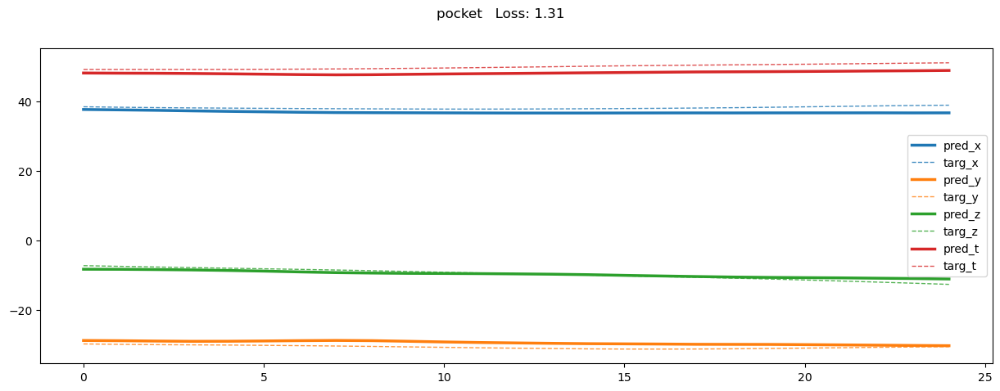

In [40]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::5000]:
    plot_result(rs)

(1273, 3) (1273,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    14.02    22.74    14.53    17.09
         pocket loss:    42.23    43.42    47.86    44.50
          swing loss:    39.20    71.07    54.40    54.89
        average loss:    31.00    44.95    37.90    37.95


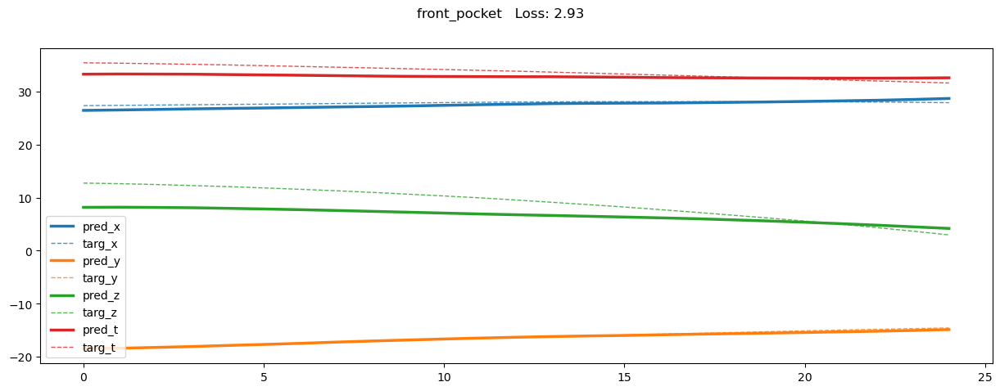

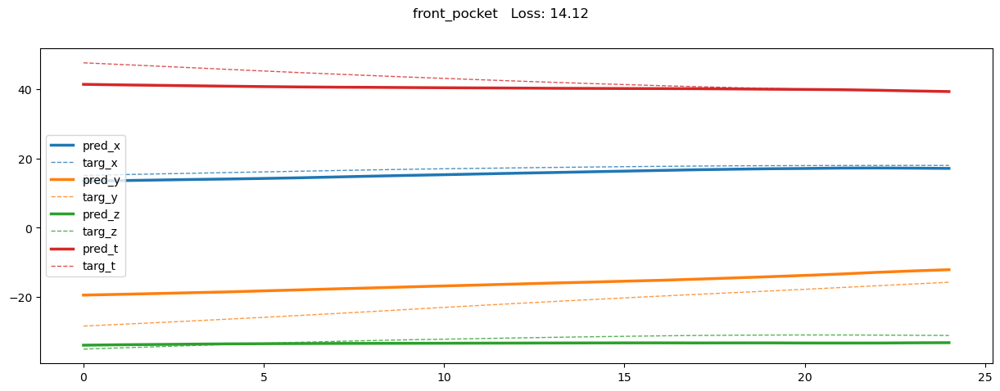

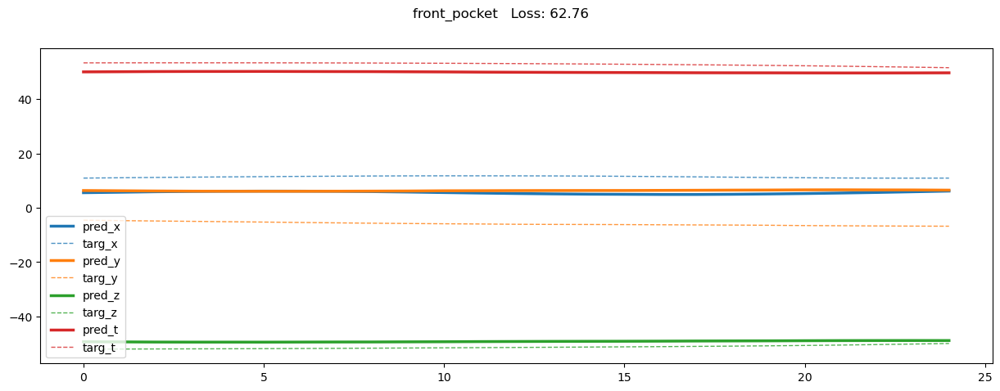

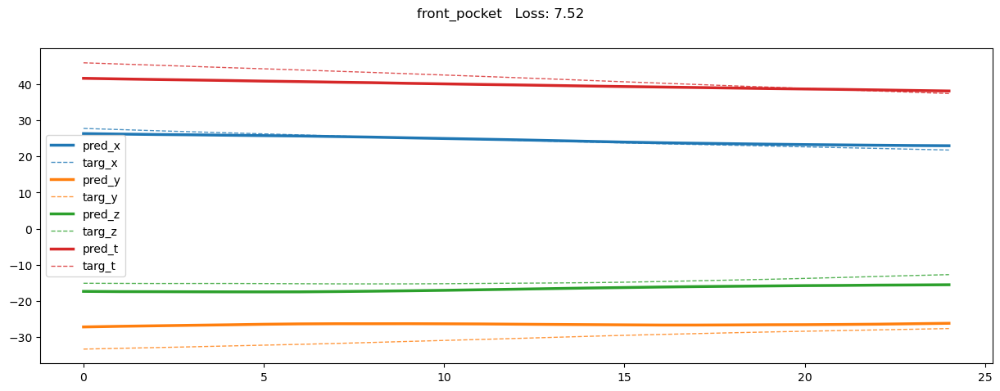

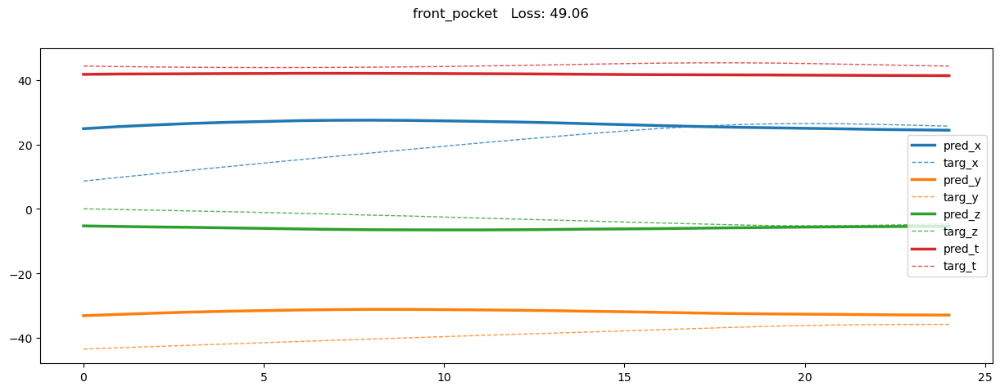

...

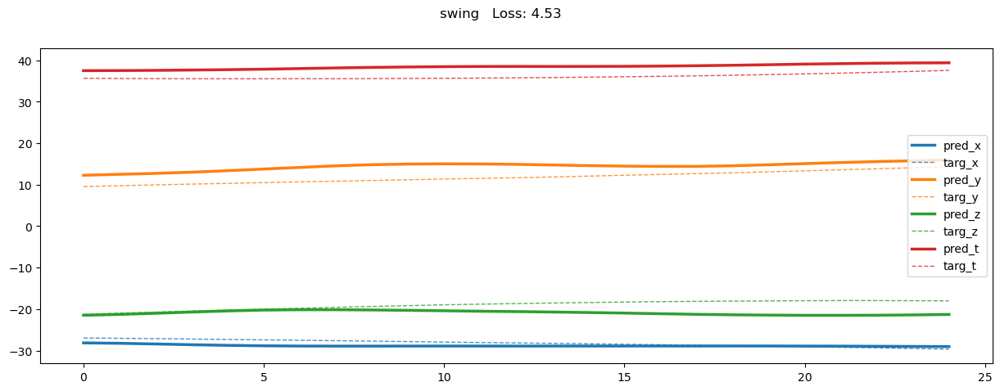

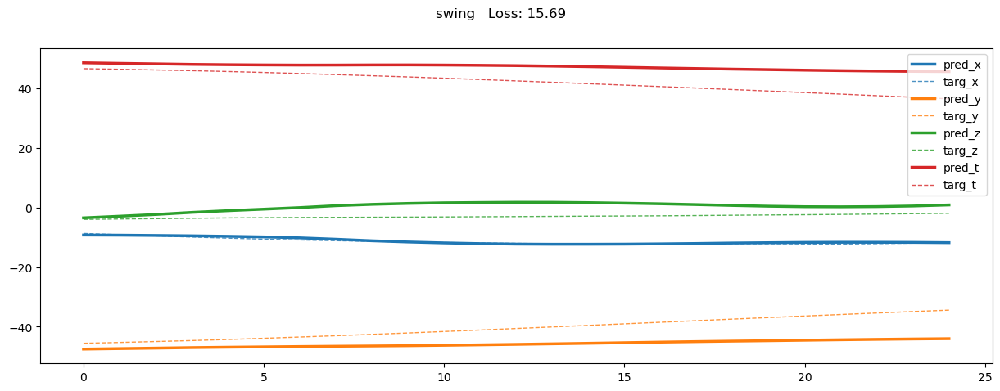

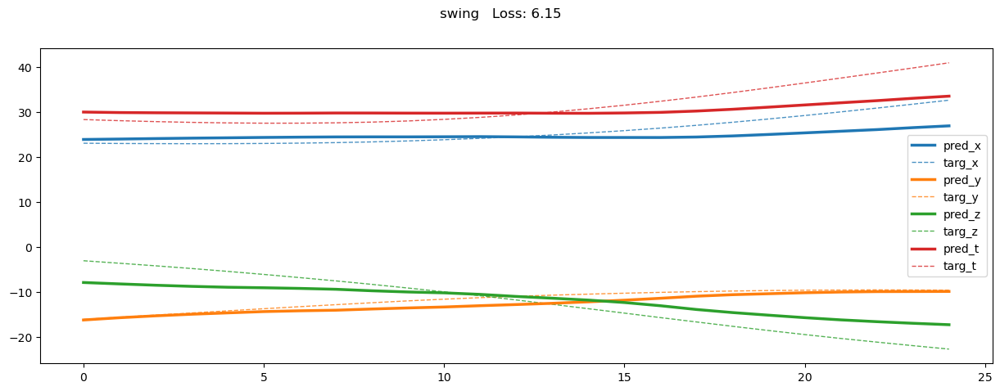

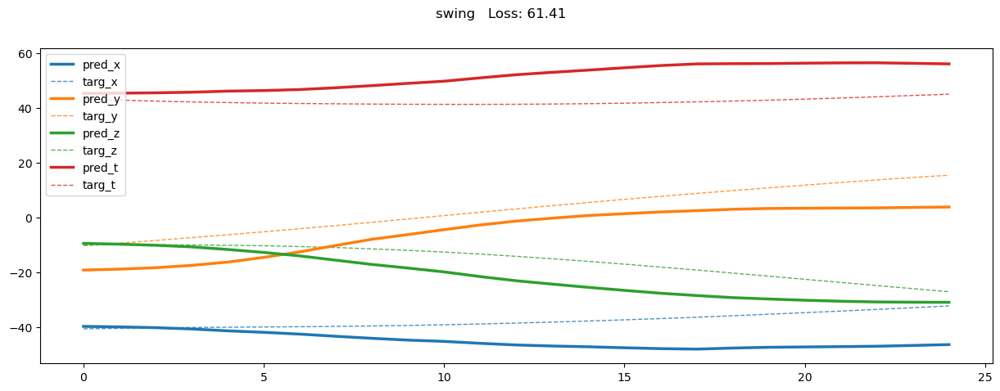

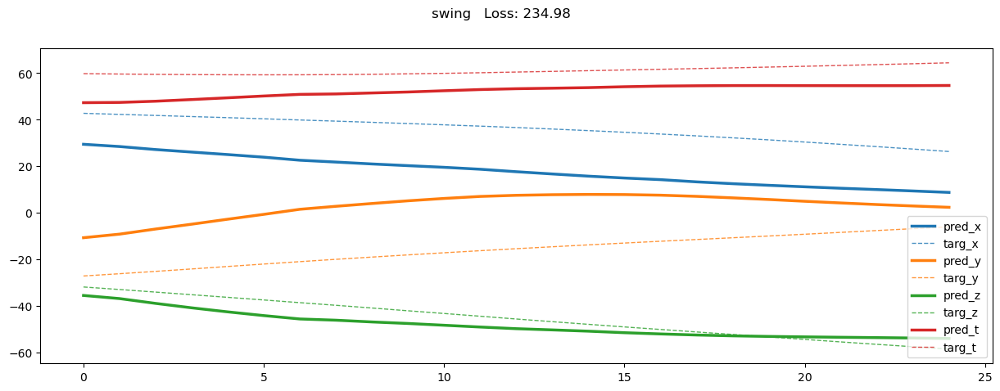

In [41]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::50]:
    plot_result(rs)

In [42]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0].reshape(-1, 3)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [43]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path)
    target_df = load_original_data(target_path)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)

def split_data(df):
    ncols = seq_len
    nrows = len(df) - seq_len + 1
    
    index = np.zeros((nrows, ncols), dtype=int)
    index += np.arange(ncols)
    index += np.arange(nrows).T[:, None]
    
    return df.to_numpy()[index]    

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

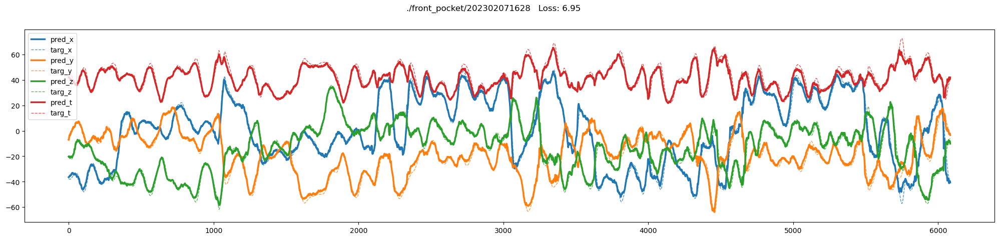

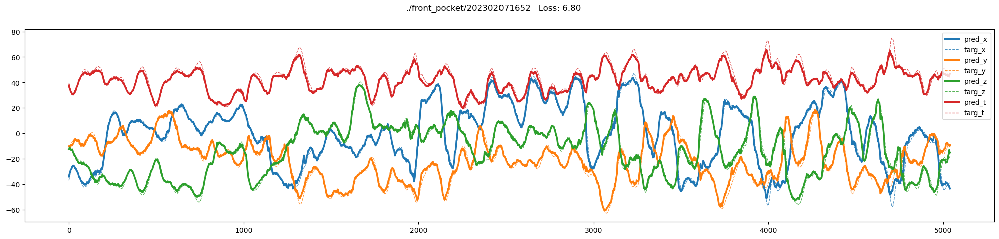

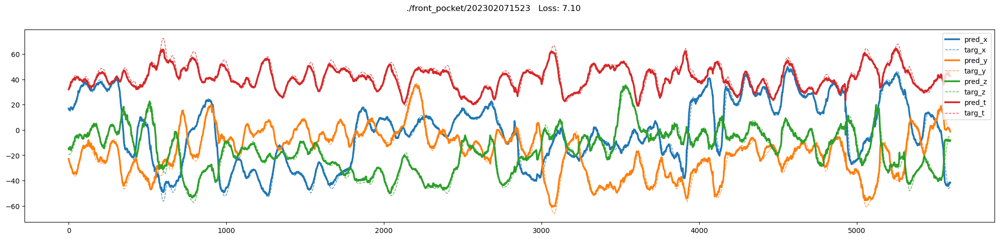

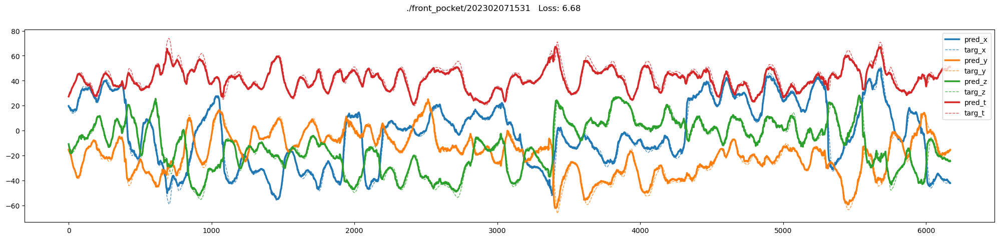

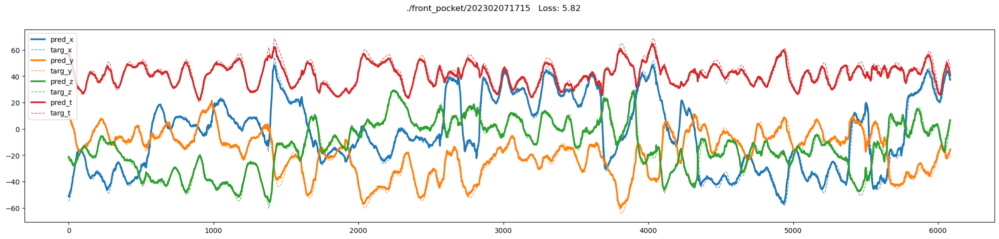

...

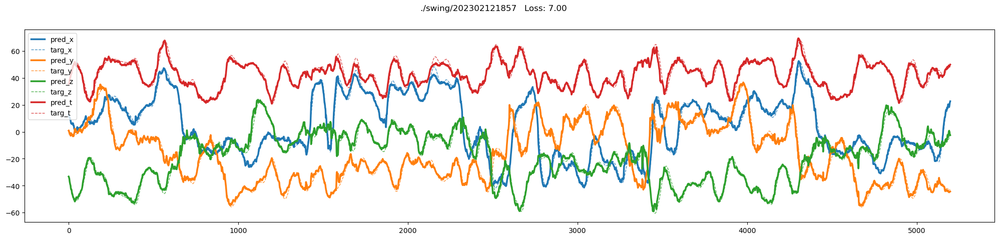

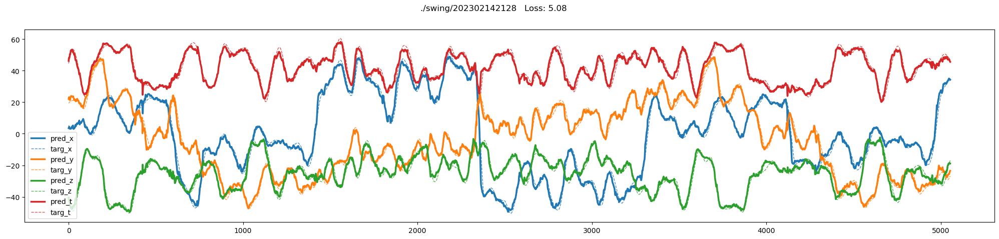

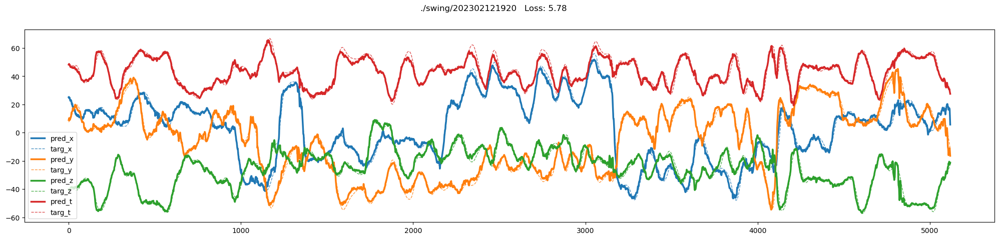

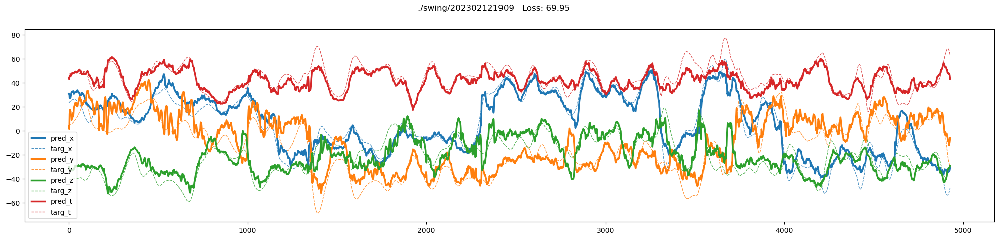

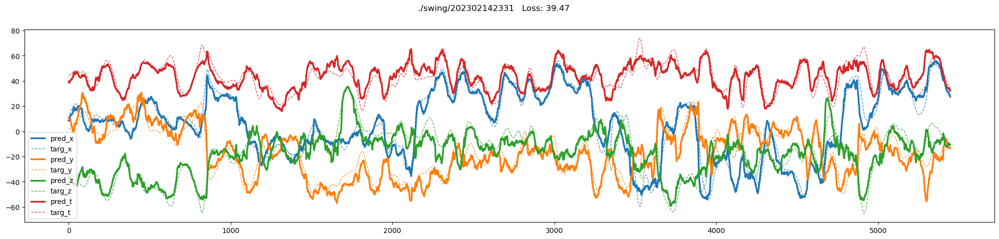

In [44]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)